<a href="https://colab.research.google.com/github/ParisaKalaki/Customer-Personality-Analysis/blob/main/Customer_Personality_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Customer Personality Analysis

## Exploratory Data Analysis

### Dataset Overview

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [ ]:
data = pd.read_csv("marketing_campaign.csv", sep='\t')

In [ ]:
data.shape

(2240, 29)

In [ ]:
print("Dataset Info:")
print(data.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    224

In [ ]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
print("Missing Values:\n",data.isnull().sum())

Missing Values:
 ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64


Income has 24 missing values.

In [ ]:
print("Duplicate rows: ",data.duplicated().sum())

Duplicate rows:  0


In [ ]:
print('Summary Statistics: ')
data.describe().T

Summary Statistics: 


,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


In [ ]:
# Basic statistics for categorical features
categorical_cols = data.select_dtypes(include='object').columns
data[categorical_cols].describe().T

,count,unique,top,freq
Education,2240,5,Graduation,1127
Marital_Status,2240,8,Married,864
Dt_Customer,2240,663,31-08-2012,12


### Handling Missing Values

In [ ]:
# Using median to replace null values due to extreme outliers - 666666
data['Income'] = data['Income'].fillna(data['Income'].median())
print("Missing Values(Income):", data['Income'].isna().sum())

Missing Values(Income): 0


### Handling Outliers

In [ ]:
categorical_columns = ['Education','Marital_Status','AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Response','Complain']
for col in categorical_columns:
    print(f"{col}: {data[col].nunique()} unique values")

Education: 5 unique values
Marital_Status: 8 unique values
AcceptedCmp1: 2 unique values
AcceptedCmp2: 2 unique values
AcceptedCmp3: 2 unique values
AcceptedCmp4: 2 unique values
AcceptedCmp5: 2 unique values
Response: 2 unique values
Complain: 2 unique values


In [ ]:
data=data.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat",
                          "MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

In [ ]:
categorical_charts = []
for col in categorical_columns:
    chart = alt.Chart(data).mark_bar().encode(
        x=alt.X(f'{col}:N', title=col),
        y=alt.Y('count()', title='Count'),
        tooltip=[f'{col}:N', 'count()']
    ).properties(
        title=f'Distribution of {col}',
        width=300,
        height=300
    )
    categorical_charts.append(chart)

# Combine into a grid layout
grid = alt.vconcat(
    alt.hconcat(*categorical_charts[:3]),
    alt.hconcat(*categorical_charts[3:6]),
    alt.hconcat(*categorical_charts[6:9]),
).configure_axisX(labelAngle=45)

grid.display()

alt.VConcatChart(...)

In [ ]:
# Replace specific values in martial status
data['Marital_Status'] = data['Marital_Status'].replace({
    'Together': 'Married',
    'Alone': 'Single',
    'Divorced': 'Single',
    'Widow': 'Single'
})

# Replace 'YOLO' and 'Absurd' with the mode
mode_value = data['Marital_Status'].mode()[0]
data['Marital_Status'] = data['Marital_Status'].replace({
    'YOLO': mode_value,
    'Absurd': mode_value
})

In [ ]:
data['Education'] = data['Education'].replace({'2n Cycle': 'Schooling','Basic': 'Schooling'})

In [ ]:
data[data['Year_Birth'] <= 1915]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Wines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
192,7829,1900,Schooling,Single,36640.0,1,0,26-09-2013,99,15,...,5,0,0,0,0,0,1,3,11,0
239,11004,1893,Schooling,Single,60182.0,0,1,17-05-2014,23,8,...,4,0,0,0,0,0,0,3,11,0
339,1150,1899,PhD,Married,83532.0,0,0,26-09-2013,36,755,...,1,0,0,1,0,0,0,3,11,0


In [ ]:
data['Year_Birth'] = data['Year_Birth'].replace({
    1893 : 1993,
    1900 : 2000,
    1899 : 1999
})

In [ ]:
data[data['Income']>= 200000.000000]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Wines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2233,9432,1977,Graduation,Married,666666.0,1,0,02-06-2013,23,9,...,6,0,0,0,0,0,0,3,11,0


In [ ]:
print(data[data['Income']>= 200000.000000])

        ID  Year_Birth   Education Marital_Status    Income  Kidhome  \
2233  9432        1977  Graduation        Married  666666.0        1   

      Teenhome Dt_Customer  Recency  Wines  ...  NumWebVisitsMonth  \
2233         0  02-06-2013       23      9  ...                  6   

      AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
2233             0             0             0             0             0   

      Complain  Z_CostContact  Z_Revenue  Response  
2233         0              3         11         0  

[1 rows x 29 columns]


In [ ]:
# capping values greater than 200000 as this outlier can pull the cluster centroids far
# Optional not capping it, this could be a high-value customer, then their extreme values could be meaningful and worth preserving.

data = data[(data["Income"]<600000)]

### Feature Engineering

1. household_size - it reflects family size which may influence spending behavior. Larger households may purchase more meat, sweets, or household products and Smaller households may spend more on premium or individual-focused items.

In [ ]:
data = data.copy()

In [ ]:
data['children'] = data['Kidhome'] + data['Teenhome']
data['household_size'] = np.where( data['Marital_Status'] == 'Married', data['children']+ 2, data['children'] + 1)

2. age - may correlate strongly with preferences and buying patterns.

In [ ]:
data['age'] = 2024 - data['Year_Birth']

In [ ]:
# binning ages to contribute age distribution - 'Young-Adults', 'Adults', 'Middle-Aged', 'Retired', 'Senior'
# bins = [18, 30, 45, 60, 75, 100]
# labels = [1, 2, 3, 4, 5]
# data['age_bin'] = pd.cut(data['age'], bins=bins, labels=labels, right=False)

3. total_spent - it represents total customer value across categories.

In [ ]:
spending_cols = ['Wines','Fruits','Meat','Fish','Sweets','Gold']
data['total_spent'] = data[spending_cols].sum(axis=1)

4. campaign_response - measures how customers respond to marketing campaigns

In [ ]:
campaign_cols = ['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Response']
data['accepted_cmps'] = data[campaign_cols].sum(axis=1)
data['promotions'] = data['accepted_cmps'] / len(campaign_cols)

5. Total Purchases - it summarises purchasing history irrespective of channel mode

Which method accounts for total spent and how much amount of each category - wine, sweets etc

In [ ]:
data['total_purchases'] = (data['NumWebPurchases'] + data['NumCatalogPurchases'] + data['NumStorePurchases'])

6. Online Engagement - it combines number of web purchases and web visits.

In [ ]:
data['online_engagement'] = data['NumWebPurchases'] + data['NumWebVisitsMonth']

7. Deal Sensitivity - It tells what proportion of purchases that were motivated by deals. If the value is approximately 1: Customer buys only when deal is offered and 0: Buys full price

Divided by total_purchases because not all of them were necessarily deal-based.

In [ ]:
data['deal_sensitivity'] = data['NumDealsPurchases'] / data['total_purchases']
data['deal_sensitivity'] = data['deal_sensitivity'].replace([np.inf, -np.inf], 0)
data['deal_sensitivity'] = data['deal_sensitivity'].fillna(0)

### Feature Selection

In [ ]:
alt.Chart(data).mark_circle(size=60).encode(
    x='total_spent',
    y='Income',
    tooltip=['Income', 'total_spent']
).properties(
    title='Income vs Total Spending',
    width=400,
    height=300
).interactive()

alt.Chart(...)

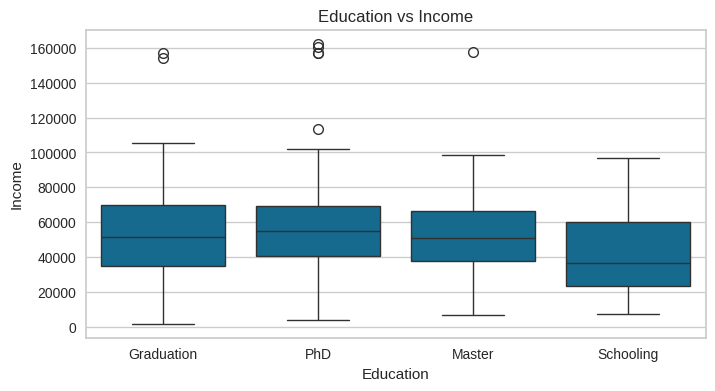

In [ ]:
plt.figure(figsize=(8, 4))
sns.boxplot(data=data, x='Education', y='Income')
plt.title('Education vs Income')
plt.show()

In [ ]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Wines,...,Response,children,household_size,age,total_spent,accepted_cmps,promotions,total_purchases,online_engagement,deal_sensitivity
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,1,0,1,67,1617,1,0.166667,22,15,0.136364
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,0,2,3,70,27,0,0.000000,4,6,0.500000
2,4141,1965,Graduation,Married,71613.0,0,0,21-08-2013,26,426,...,0,0,2,59,776,0,0.000000,20,12,0.050000
3,6182,1984,Graduation,Married,26646.0,1,0,10-02-2014,26,11,...,0,1,3,40,53,0,0.000000,6,8,0.333333
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,0,1,3,43,422,0,0.000000,14,10,0.357143


In [ ]:
# Encode Marital Status
# Initialize encoder
le = LabelEncoder()
data['Marital_Status'] = le.fit_transform(data['Marital_Status'])

# Encode Education
data['Education'] = data['Education'].map({
    'Schooling': 1,
    'Graduation': 2,
    'Master': 3,
    'PhD': 4
})

In [ ]:
data_classification = data.copy() # for classification models
data_regression = data.copy() # for regression models

In [ ]:
data_classification.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'children', 'household_size', 'age', 'total_spent', 'accepted_cmps',
       'promotions', 'total_purchases', 'online_engagement',
       'deal_sensitivity'],
      dtype='object')

In [ ]:
# dropping columns
to_drop = ['ID', 'Year_Birth', 'Z_CostContact', 'Z_Revenue', 'Response', 'ID','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain']
data = data.drop(to_drop, axis=1)

In [ ]:
data.columns

Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets',
       'Gold', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'children', 'household_size',
       'age', 'total_spent', 'accepted_cmps', 'promotions', 'total_purchases',
       'online_engagement', 'deal_sensitivity'],
      dtype='object')

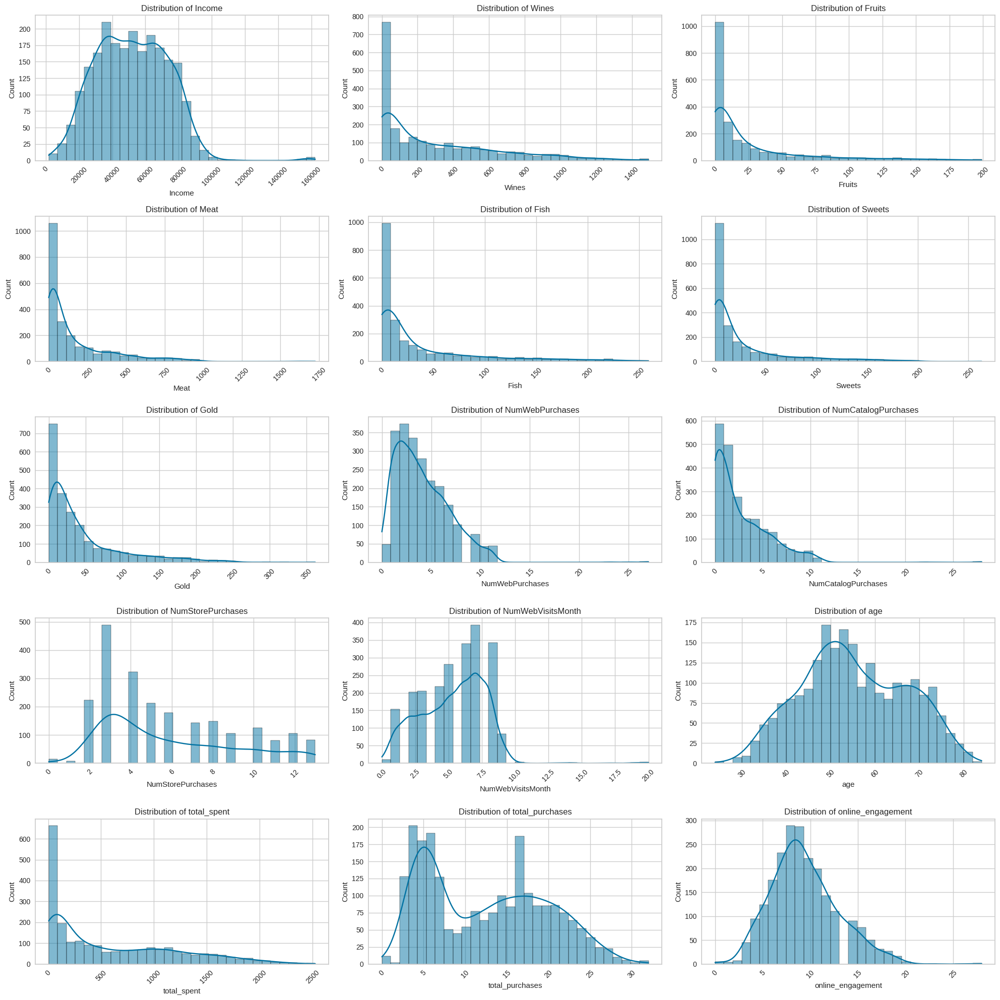

In [ ]:
# Set up the grid
fig, axes = plt.subplots(5, 3, figsize=(20, 20))  # 5 rows x 3 columns
axes = axes.flatten()

# Plot each numerical column
numerical_columns = ['Income', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets',
                     'Gold', 'NumWebPurchases', 'NumCatalogPurchases',
                     'NumStorePurchases', 'NumWebVisitsMonth', 'age',
                     'total_spent', 'total_purchases', 'online_engagement']

for i, col in enumerate(numerical_columns):
    sns.histplot(data[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].tick_params(axis='x', rotation=45)  # Optional: tilt x labels if needed

# Hide any unused axes if the number of plots < total grid size
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


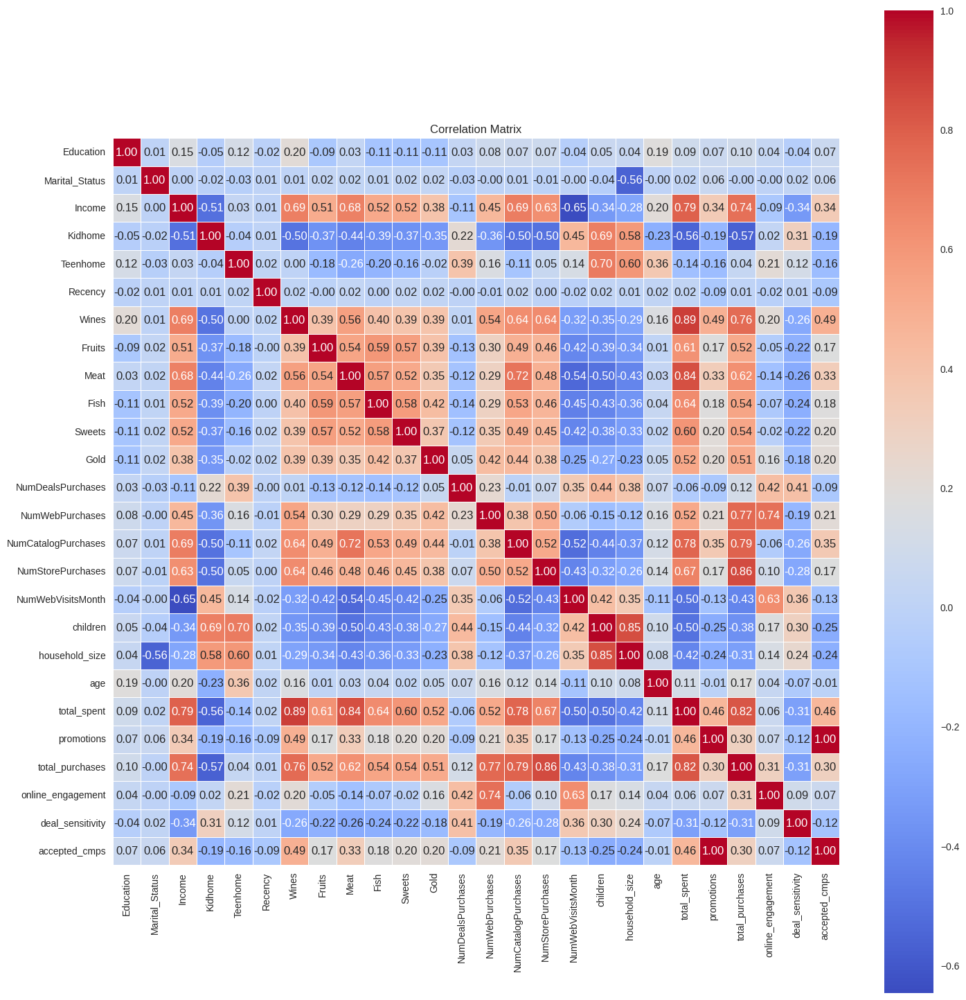

In [ ]:
correlation_features = ['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome','Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets',
       'Gold', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases','NumStorePurchases', 'NumWebVisitsMonth', 'children', 'household_size',
       'age', 'total_spent', 'promotions', 'total_purchases','online_engagement', 'deal_sensitivity','accepted_cmps']
corr_matrix = data[correlation_features].corr()

# Plot heatmap
plt.figure(figsize=(15,15))
sns.heatmap(
    corr_matrix,
    annot=True,        # display values in cells
    fmt=".2f",         # 2 decimal places
    cmap='coolwarm',   # red-blue color scale
    square=True,       # square cells
    linewidths=0.5     # border lines
)
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

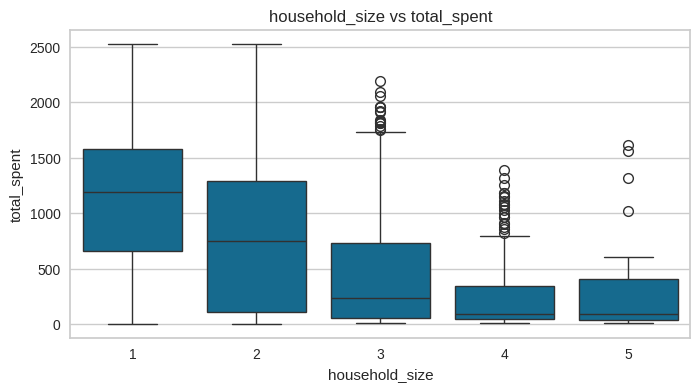

In [ ]:
plt.figure(figsize=(8, 4))
sns.boxplot(data=data, x='household_size', y='total_spent')
plt.title('household_size vs total_spent')
plt.show()

In [ ]:
data.describe()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,NumWebVisitsMonth,children,household_size,age,total_spent,accepted_cmps,promotions,total_purchases,online_engagement,deal_sensitivity
count,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,...,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000
mean,2.484591,0.353729,51963.554712,0.443948,0.506476,49.121036,304.067441,26.307727,167.016525,37.538633,...,5.316213,0.950424,2.596695,55.063868,606.041090,0.447075,0.074512,12.539527,9.401519,0.247155
std,0.955960,0.478233,21410.672116,0.538390,0.544555,28.963662,336.614830,39.781468,225.743829,54.637617,...,2.427144,0.751970,0.905947,11.742163,602.274089,0.890692,0.148449,7.206400,3.586418,0.356445
min,1.000000,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,24.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,35533.500000,0.000000,0.000000,24.000000,24.000000,1.000000,16.000000,3.000000,...,3.000000,0.000000,2.000000,47.000000,69.000000,0.000000,0.000000,6.000000,7.000000,0.083333
50%,2.000000,0.000000,51381.500000,0.000000,0.000000,49.000000,174.000000,8.000000,67.000000,12.000000,...,6.000000,1.000000,3.000000,54.000000,396.000000,0.000000,0.000000,12.000000,9.000000,0.200000
75%,3.000000,1.000000,68277.500000,1.000000,1.000000,74.000000,504.500000,33.000000,232.000000,50.000000,...,7.000000,1.000000,3.000000,65.000000,1046.000000,1.000000,0.166667,18.000000,11.000000,0.333333
max,4.000000,1.000000,162397.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,3.000000,5.000000,84.000000,2525.000000,5.000000,0.833333,32.000000,28.000000,15.000000


In [ ]:
selected_features=['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome','Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets',
       'Gold', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases','NumStorePurchases', 'NumWebVisitsMonth', 'children', 'household_size',
       'age', 'total_spent','total_purchases','online_engagement', 'deal_sensitivity','accepted_cmps']

data = data[selected_features]

In [ ]:
sscaler = StandardScaler()
sscaler.fit(data)
sscaled_data = pd.DataFrame(sscaler.transform(data),columns= data.columns )
print("All features are now scaled using standard scaler")


All features are now scaled using standard scaler


## Clustering

### Dimensionality Reduction

In [ ]:
#to determine the n_component value
X_covariance_matrix = np.cov(sscaled_data.T)

eig_vals, eig_vecs = np.linalg.eig(X_covariance_matrix)

# print('Eigenvectors \n%s' %eig_vecs)
# print('\nEigenvalues \n%s' %eig_vals)

# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i[0])

tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Variance captured by each component is \n",var_exp)
print(40 * '-')
print("Cumulative variance captured as we travel each component \n",cum_var_exp)

Eigenvalues in descending order:
8.854279729708571
3.1941758963064086
1.814857186002407
1.4596943822488766
1.2096323883506281
1.1421001355835951
0.9979367803379638
0.8681110774544527
0.8182278997061609
0.7135422946702423
0.6267528410029756
0.551865746036825
0.4634669309228428
0.44892082593272653
0.39667575404539634
0.3922431313331386
0.35481080641826085
0.28264097564486046
0.23830296830987566
0.18293293809820207
1.7485795674585684e-15
1.6616144000579574e-15
5.686586180191378e-16
2.0927326247423018e-16
2.6745994412172205e-17
Variance captured by each component is 
 [np.float64(35.401300643301056), np.float64(12.770997152181755), np.float64(7.25618648016683), np.float64(5.836169767705195), np.float64(4.836368530823946), np.float64(4.56636016692467), np.float64(3.989964295482557), np.float64(3.4708934191032847), np.float64(3.2714498249975645), np.float64(2.852894426926308), np.float64(2.505891662643427), np.float64(2.206477069460319), np.float64(1.8530397345338476), np.float64(1.794881301

In [ ]:
pca = PCA(n_components=8)
pca.fit(sscaled_data)

# Create a DataFrame of principal components
pca_columns = [f'PC{i+1}' for i in range(8)]
pca_data = pd.DataFrame(pca.transform(sscaled_data), columns=pca_columns)
pca_data.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
count,2.239000e+03,2.239000e+03,2.239000e+03,2.239000e+03,2.239000e+03,2.239000e+03,2.239000e+03,2.239000e+03
mean,7.299010e-17,7.616358e-17,2.380112e-18,3.332157e-17,-3.173483e-17,2.856134e-17,9.579950e-17,-1.110719e-17
std,2.975614e+00,1.787226e+00,1.347166e+00,1.208178e+00,1.099833e+00,1.068691e+00,9.989679e-01,9.317248e-01
min,-9.484537e+00,-4.737428e+00,-4.831047e+00,-7.197645e+00,-3.163075e+00,-5.069590e+00,-2.691448e+00,-3.303960e+00
25%,-2.683577e+00,-1.404639e+00,-9.452550e-01,-8.097002e-01,-7.292604e-01,-6.727102e-01,-8.153335e-01,-5.067666e-01
50%,-7.408133e-01,-2.619948e-01,-2.752463e-04,-6.877263e-03,-3.557987e-02,-9.612764e-02,1.543758e-02,3.195325e-02
75%,2.587676e+00,1.240240e+00,9.071470e-01,7.940636e-01,7.004011e-01,6.330526e-01,8.189567e-01,5.226222e-01
max,7.977018e+00,6.875644e+00,1.122444e+01,3.817000e+00,4.278641e+00,2.246465e+01,2.291085e+00,2.404679e+01


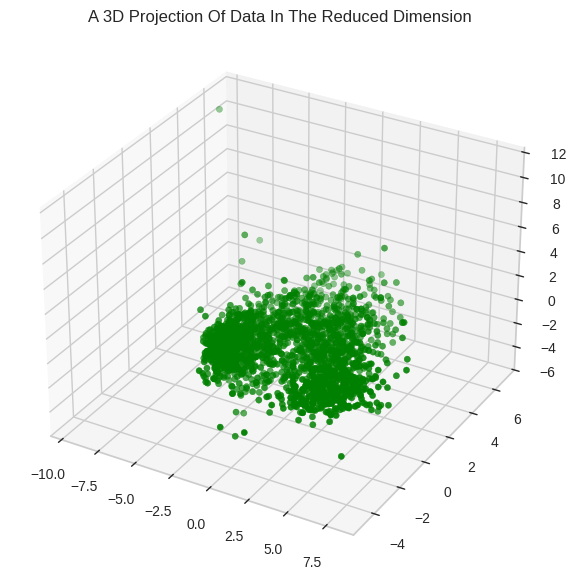

In [ ]:
#A 3D Projection Of Data In The Reduced Dimension
x =pca_data["PC1"]
y =pca_data["PC2"]
z =pca_data["PC3"]
#To plot
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="green", marker="o" )
ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

Elbow Method to determine the number of clusters to be formed:


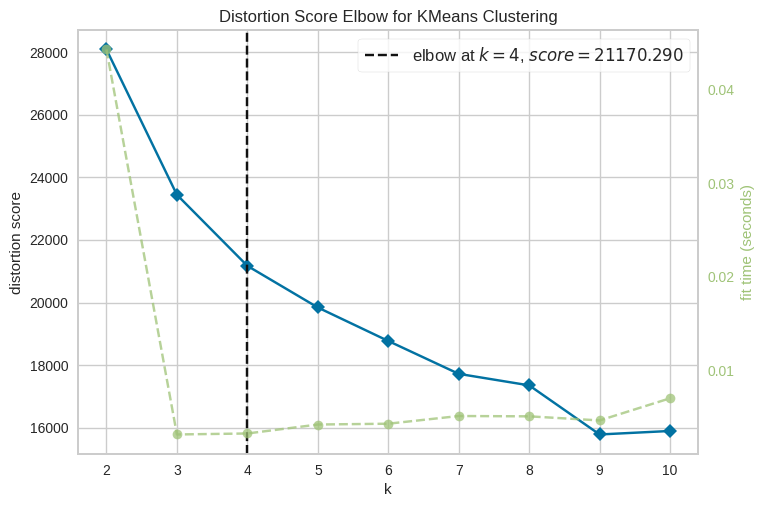

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Quick examination of elbow method to find numbers of clusters to make.
print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(pca_data)
Elbow_M.show()

### Modelling

In [ ]:
# Apply Agglomerative Clustering (choose k = 4 as per earlier evaluation)
agglo = AgglomerativeClustering(n_clusters=4)
agglo_labels = agglo.fit_predict(pca_data)

# Add cluster labels to the DataFrame
pca_data['Agglo_Cluster'] = agglo_labels

data['Clusters']= agglo_labels

agglo_score = silhouette_score(pca_data, agglo_labels)
print(f"GMM Silhouette Score: {agglo_score:.3f}")

GMM Silhouette Score: 0.225


In [ ]:
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,NumWebVisitsMonth,children,household_size,age,total_spent,total_purchases,online_engagement,deal_sensitivity,accepted_cmps,Clusters
0,2,1,58138.0,0,0,58,635,88,546,172,...,7,0,1,67,1617,22,15,0.136364,1,2
1,2,1,46344.0,1,1,38,11,1,6,2,...,5,2,3,70,27,4,6,0.500000,0,0
2,2,0,71613.0,0,0,26,426,49,127,111,...,4,0,2,59,776,20,12,0.050000,0,3
3,2,0,26646.0,1,0,26,11,4,20,10,...,6,1,3,40,53,6,8,0.333333,0,1
4,4,0,58293.0,1,0,94,173,43,118,46,...,5,1,3,43,422,14,10,0.357143,0,1


<ipython-input-49-5c436397b33e>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set2', n_clusters)


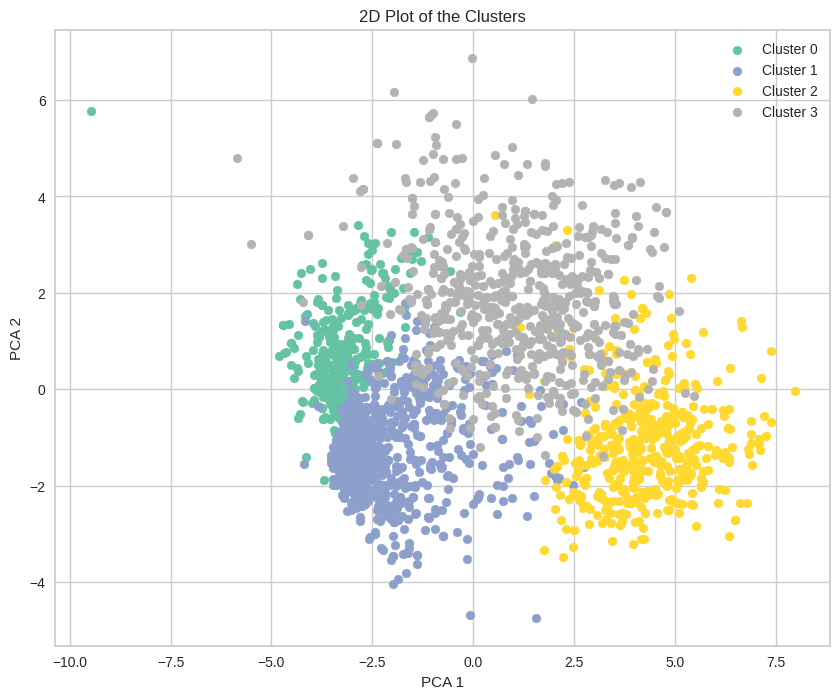

In [ ]:
n_clusters = pca_data["Agglo_Cluster"].nunique()

colors = cm.get_cmap('Set2', n_clusters)

fig = plt.figure(figsize=(10, 8))
ax = plt.subplot(111)

for idx, cluster_label in enumerate(sorted(pca_data["Agglo_Cluster"].unique())):
    mask = pca_data["Agglo_Cluster"] == cluster_label
    ax.scatter(x[mask], y[mask], s=40, label=f"Cluster {cluster_label}", marker='o', color=colors(idx))

ax.set_title("2D Plot of the Clusters")
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
ax.legend()
plt.show()


### Visualisations

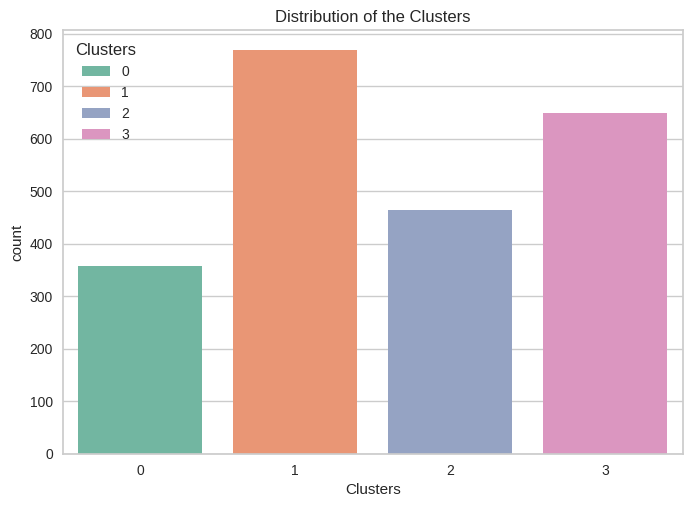

In [ ]:
sns.countplot(data=data, x='Clusters', hue='Clusters', palette='Set2')
plt.title("Distribution of the Clusters")
plt.show()

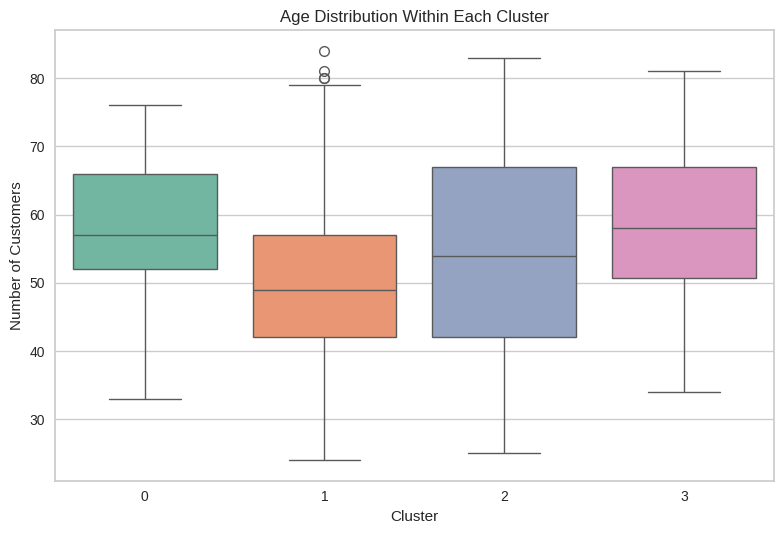

In [ ]:
sns.boxplot(data=data, x='Clusters', y='age', hue='Clusters', palette='Set2', legend=False)
plt.title('Age Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.tight_layout()
plt.show()

Clusters 0 and 3 are slightly older on average.
Cluster 1 has a younger and more varied age base.
Cluster 2 is the most diverse in terms of age spread.
The age distribution across clusters supports the idea that customer behavior is not age-exclusive — different segments can span generations.

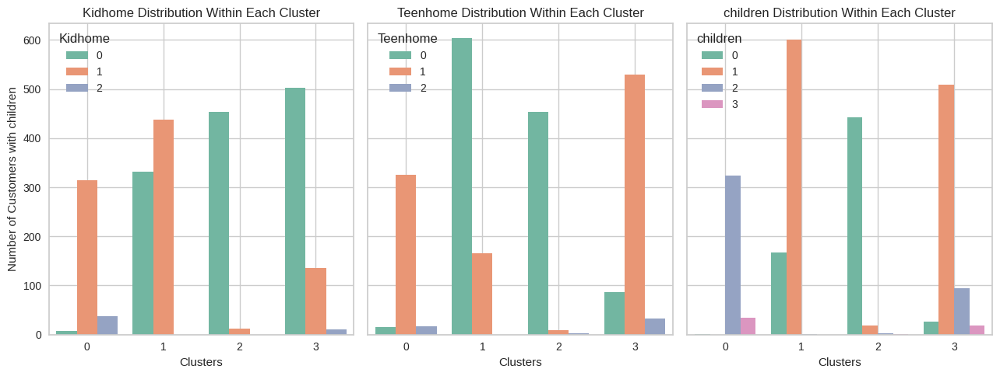

In [ ]:
num_child=['Kidhome', 'Teenhome','children']
fig, axs = plt.subplots(1, 3, figsize=(13, 5), sharey=True)
for ax, i in zip(axs, num_child):
    sns.countplot(data=data, x='Clusters', hue=i, palette='Set2', ax=ax)
    ax.set_title(f'{i} Distribution Within Each Cluster')
    ax.set_xlabel('Clusters')
    ax.set_ylabel(f'Number of Customers with children')
    ax.grid(True)
    ax.legend().set_title(i)

plt.tight_layout()
plt.show()

Kidhome (Young Children)

Cluster 3 and Cluster 2 have the highest number of customers with no kids.
Cluster 1 and Cluster 0 have more families with 1 child.
Cluster 0 has the most customers with 2 children, though still relatively fewer than those with one.

Teenhome (Teenagers)

Cluster 2 and Cluster 3 again show a large population with no teenagers.
Cluster 1 has a broader mix, with many families having 1 teenager.
Cluster 0 is the most balanced across 0, 1, and 2 teenagers.

Children (Total Combined)

Cluster 1 shows a large count with 1 child – highest among all clusters.
Cluster 0 has more customers with 2 or more children, including some with 3.
Clusters 2 and 3 are again dominated by customers with no children.

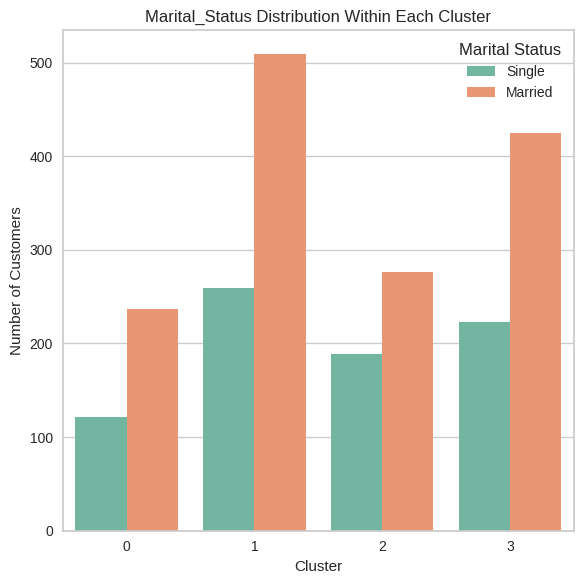

In [ ]:
Marital_Status_map = {1: 'Single', 0: 'Married'}
data['Marital_Status'] = data['Marital_Status'].map(Marital_Status_map)

plt.figure(figsize=(6, 6))
sns.countplot(data=data, x='Clusters', hue='Marital_Status', palette='Set2')
plt.title('Marital_Status Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.legend(title='Marital Status')
plt.tight_layout()
plt.show()

Cluster 0: Married customers are higher than singles
Singles form a relatively smaller proportion. Likely family-oriented couples.

Cluster 1: Highest number of married customers overall (~500+). Strong presence of singles too. Possibly represents mature households with mixed demographics, likely a prime target for family-based marketing

Cluster 2: More balanced distribution between single and married. Both categories well represented, indicates a mixed lifestyle group, could include both young professionals and small families

Cluster 3: Married customers dominate after cluster 1 with moderate number of single individuals. Suggests stable mid-life households, likely dual-income families

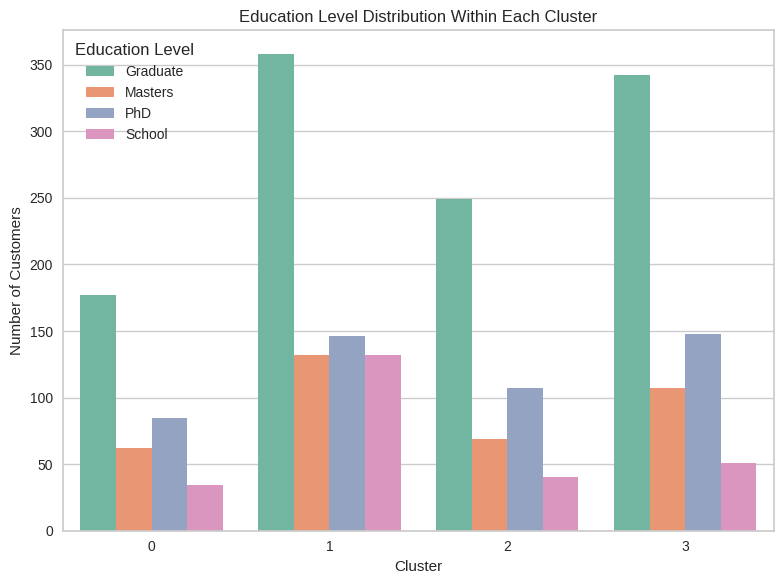

In [ ]:
education_map = {1: 'School', 2: 'Graduate', 3: 'Masters', 4: 'PhD'}
data['Education'] = data['Education'].map(education_map)

plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='Clusters', hue='Education', palette='Set2')
plt.title('Education Level Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.legend(title='Education Level')
plt.tight_layout()
plt.show()

Cluster 0: Mostly composed of Graduates, followed by PhDs and Masters.
Very few with School-level education. It suggests a relatively well-educated segment, possibly entry-to-mid career professionals.

Cluster 1: Dominated by Graduates with high counts in all education levels, including the highest number of School-educated individuals among all clusters.
Also has the most balanced education diversity, with significant representation of Masters and PhDs. Likely a mixed demographic — both highly educated professionals and lower-educated individuals, possibly driving mid-range engagement.

Cluster 2: Primarily Graduates, with noticeable presence of PhDs and Masters.
Few School-level individuals. Represents a highly educated cluster, likely contributing to high spending and loyalty.

Cluster 3: Very similar to Cluster 1 in structure. Possibly a mature and professional segment with high potential for up-market targeting.

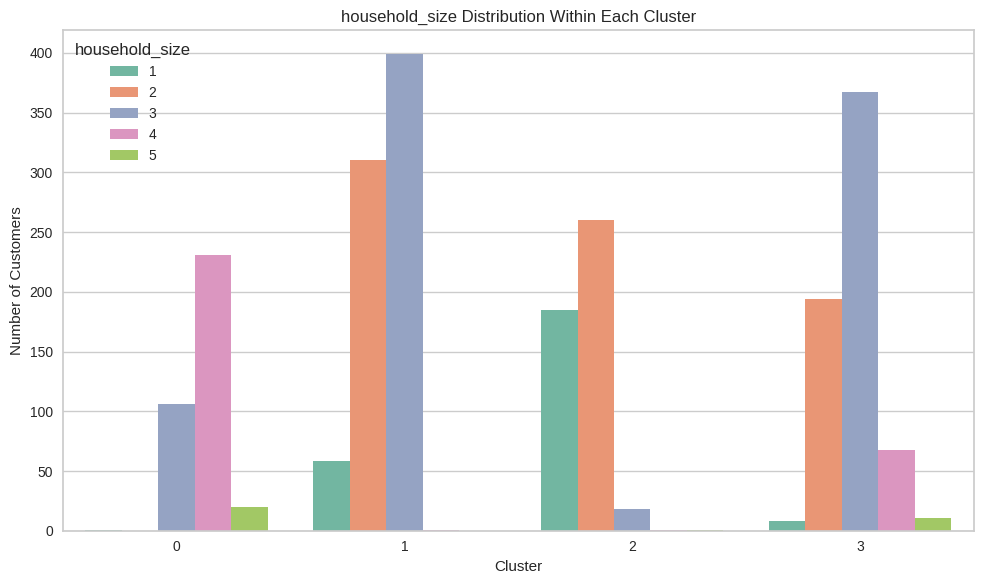

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='Clusters', hue='household_size', palette='Set2')
plt.title('household_size Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.legend(title='household_size')
plt.tight_layout()
plt.show()

Cluster 0: Dominated by larger households, especially sizes 4 and 3.
Moderate number of households with 3 members. Likely represents family-oriented customers or larger households with children.

Cluster 1: Strong presence of household size 3, followed by 2.
Minimal households with size 4 or 5. Represents small-medium sized family units, possibly couples with one child or roommates.

Cluster 2: Highest number of single-person households among all clusters.
Strong representation of 2-person households, very few larger households. Suggests younger singles or couples without children make this segment.

Cluster 3: Large portion of customers live in 3-person households, followed by 2-person. Some 4-member households, and a small count for 1- and 5-person households. Likely reflects stable mid-sized households.

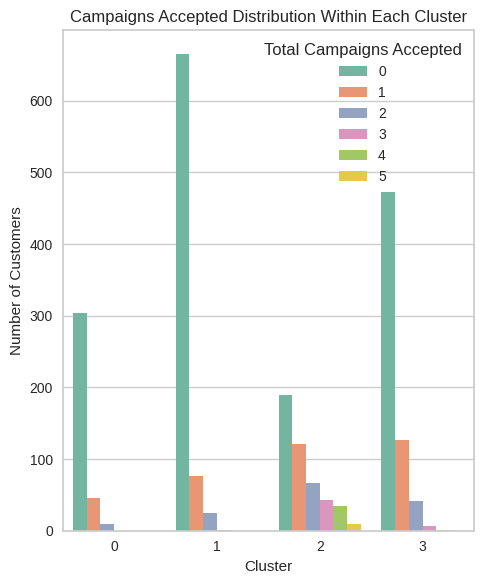

In [ ]:
plt.figure(figsize=(5, 6))
sns.countplot(data=data, x='Clusters', hue='accepted_cmps', palette='Set2')
plt.title('Campaigns Accepted Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.legend(title='Total Campaigns Accepted')
plt.tight_layout()
plt.show()

Cluster 0: Majority accepted 0 promotions. Very few accepted more than 1.

Cluster 1: Most unresponsive segment, highest number of customers with 0 accepted promotions. Minimal interaction with marketing offers.

Cluster 2: Indicated high responsive segment with most promotion-sensitive cluster. Has the highest counts of customers who accepted 2, 3, 4, or even all 5 promotions.

Cluster 3: Mixed engagement segment. Moderate acceptance, majority at 0-1 promotions. Small portion reached 2-3 accepted campaigns

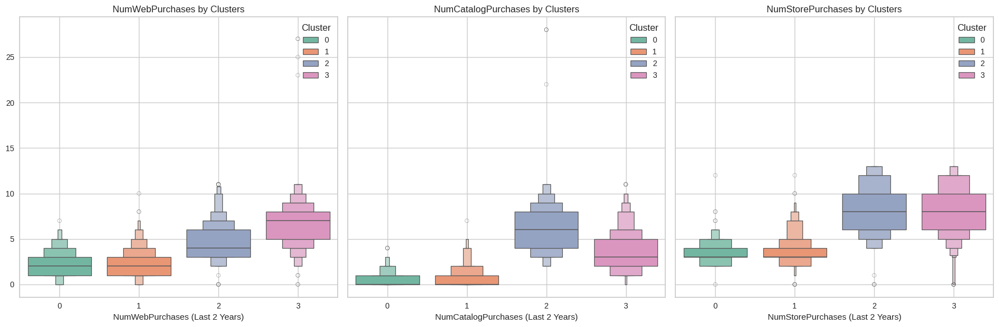

In [ ]:
features = ['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']

fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for ax, feature in zip(axs, features):
    sns.boxenplot(data=data, x='Clusters', y=feature, hue='Clusters', palette='Set2', ax=ax)
    ax.set_title(f'{feature} by Clusters')
    ax.set_xlabel(f'{feature} (Last 2 Years)')
    ax.set_ylabel('')  # We keep only one y-label for a clean look
    ax.grid(True)
    ax.legend().set_title("Cluster")
plt.tight_layout()
plt.show()

NumWebPurchases

Cluster 3: Highest number of web purchases with a wide range, indicating strong digital engagement.

Cluster 2: Also shows strong web usage but with more consistency (narrower interquartile range).

Clusters 0 & 1: Fewer web purchases overall, lower median and tighter spread, possibly less tech-savvy or prefer offline channels.

NumCatalogPurchases

Cluster 2: Clearly leads in catalog-based purchases, with some extreme outliers — strong catalog responsiveness.

Cluster 3: Also active via catalog but with slightly lower medians.

Clusters 0 & 1: Very limited catalog activity, suggesting low response to direct marketing.

NumStorePurchases by Clusters

Clusters 2 & 3: High median and upper ranges — they are frequent in-store buyers.

Cluster 1: Moderate store engagement.

Cluster 0: Minimal store interaction, possibly due to financial constraints or preference for other channels.

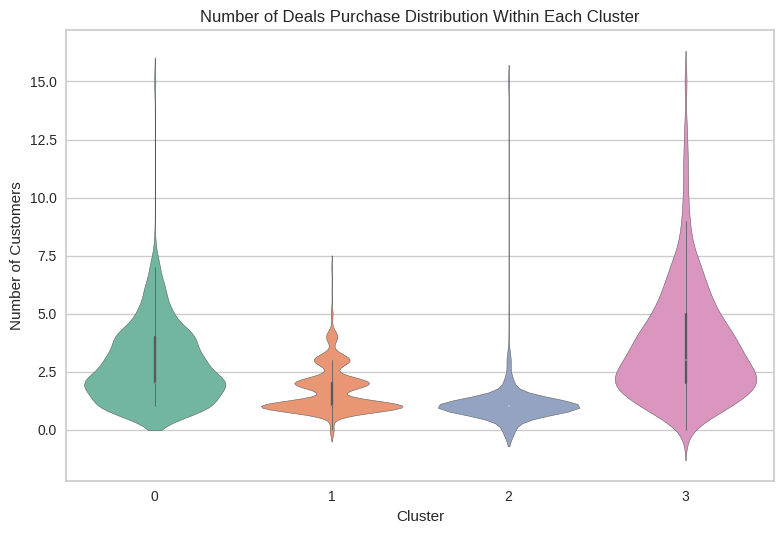

In [ ]:
sns.violinplot(data=data, x='Clusters', y='NumDealsPurchases', hue='Clusters', palette='Set2', legend=False)
plt.title('Number of Deals Purchase Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.tight_layout()
plt.show()

Cluster 0: Moderate engagement with deals. Broad distribution with some customers purchasing up to 8 deals. Customers are deal-aware but not highly sensitive to it.

Cluster 1: Low deal activity overall. Most customers purchased only 1–2 deals indicating low overall activity.

Cluster 2: Least deal-sensitive segment. Very narrow distribution around 1 deal, minimal variation. Customer prefer full-price products.

Cluster 3: Most deal-sensitive cluster. Wide distribution with customers buying 4-6 deals with some up to 14. Highly responsive to promotions & discounts.

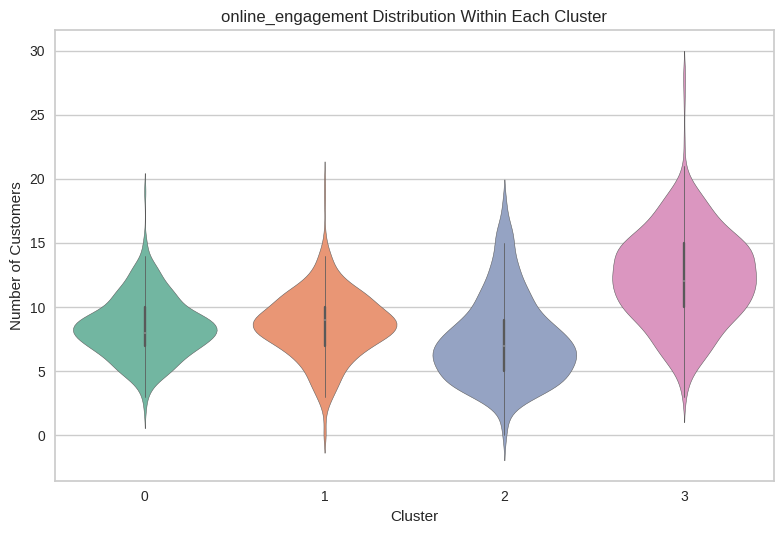

In [ ]:
sns.violinplot(data=data, x='Clusters', y='online_engagement', hue='Clusters', palette='Set2', legend=False)
plt.title('online_engagement Distribution Within Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.tight_layout()
plt.show()

Cluster 0: Moderate and consistent online activity. Likely older users or those with stable but limited digital interaction.

Cluster 1: Also moderately engaged, with a higher median than Cluster 0. Possibly younger or digitally inclined users with steady behavior.

Cluster 2: Lower engagement levels. Might reflect traditional shoppers or older segments less responsive to digital channels.

Cluster 3: Clearly the most digitally engaged cluster. Ideal target for online campaigns, email marketing, and web-based promotions.

<Axes: xlabel='Clusters', ylabel='total_spent'>

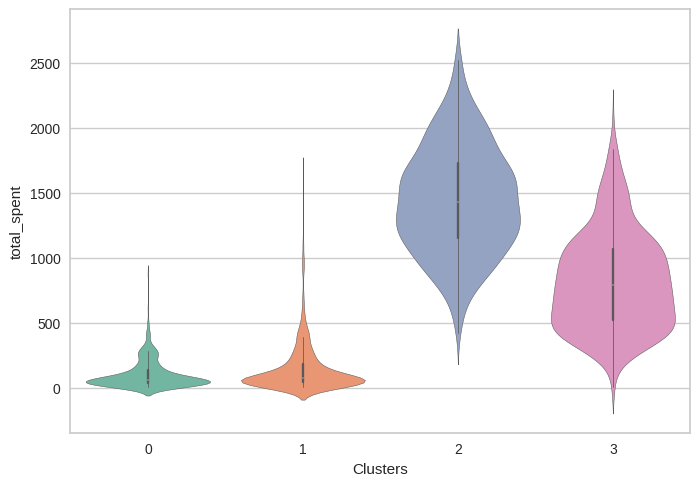

In [ ]:
sns.violinplot(data=data, x='Clusters', y='total_spent', hue='Clusters', palette='Set2', legend=False)

Cluster 2 stands out as the top-value segment.

Cluster 3 shows potential but with more spending variability.

Clusters 0 & 1 represent low-value targets—ideal for cost-efficient campaigns or promotional nudges.

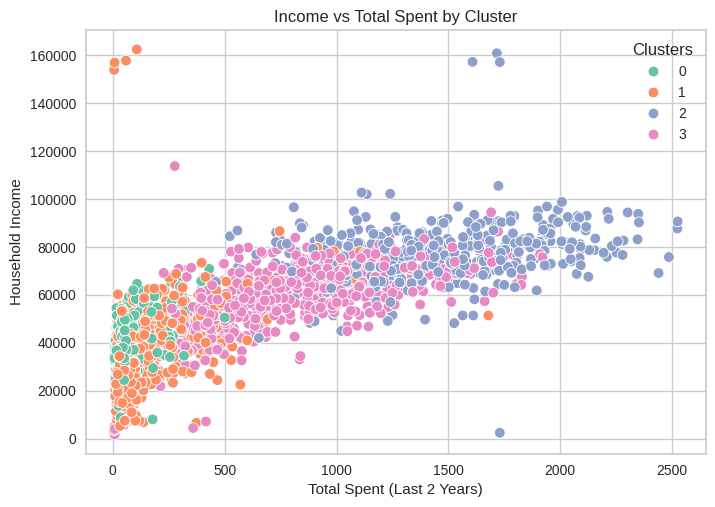

In [ ]:
sns.scatterplot(data=data, x='total_spent', y='Income', hue='Clusters', palette="Set2", s=60)
plt.title("Income vs Total Spent by Cluster")
plt.xlabel('Total Spent (Last 2 Years)')
plt.ylabel('Household Income')
plt.grid(True)
plt.show()

Income vs Total spending plot shows the clusters pattern

Cluster 0: mid income, very low spending → possibly price-sensitive or new customers

Cluster 1:	Low to mid income, still low to moderate spending → maybe casual or non-engaged

Cluster 2:	High income, high spending → likely loyal, high-value customers

Cluster 3:	Mid-to-high income but moderate spending → potentially untapped potential or conservative spenders

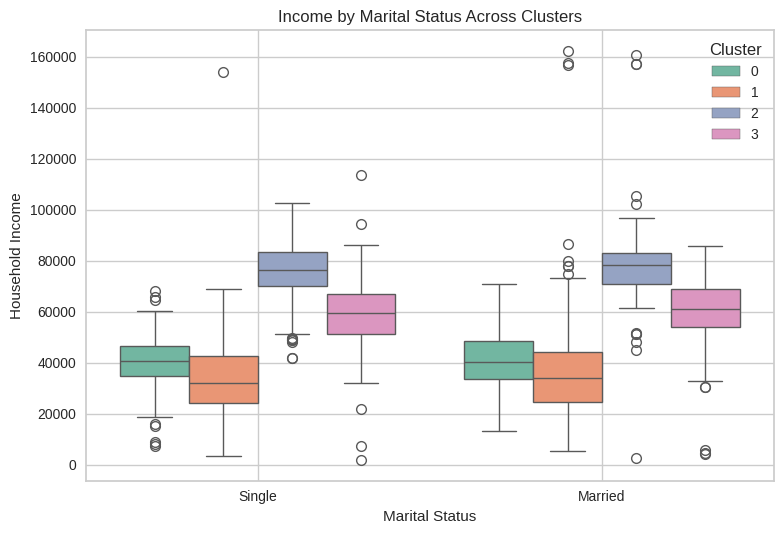

In [ ]:
sns.boxplot( data=data, x='Marital_Status', y='Income', hue='Clusters', palette='Set2')
plt.title("Income by Marital Status Across Clusters")
plt.xlabel("Marital Status")
plt.ylabel("Household Income")
plt.legend(title="Cluster")
plt.xticks()
plt.grid(True)
plt.tight_layout()
plt.show()

Cluster 0: Low and consistent income for both married and single customers — represents a stable but low-income segment.

Cluster 1: Also low-income, but singles show a wider income range — likely includes more varied life stages (e.g., students and early-career professionals).

Cluster 2: Highest income group overall. Both married and single customers have strong income levels — this is the premium, high-value segment.

Cluster 3: Mid-to-high income range. Income is consistent across marital statuses, with singles showing a slight income edge — likely financially stable professionals.

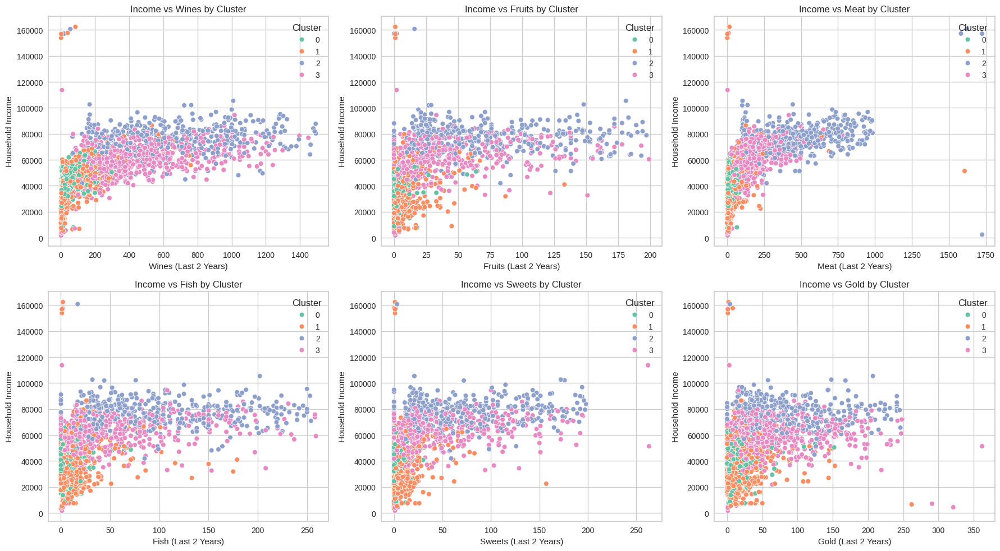

In [ ]:
features = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create 2x3 subplot grid
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs = axs.flatten()  # Flatten to loop easily

for i, feature in enumerate(features):
    sns.scatterplot(
        data=data,
        x=feature,
        y="Income",
        hue="Clusters",
        palette="Set2",
        s=40,
        ax=axs[i]  # Set the subplot to draw on
    )
    axs[i].set_title(f"Income vs {feature} by Cluster")
    axs[i].set_xlabel(f"{feature} (Last 2 Years)")
    axs[i].set_ylabel("Household Income")
    axs[i].grid(True)
    axs[i].legend(title="Cluster", loc='upper right')

plt.tight_layout()
plt.show()

Cluster 0: Low Spenders, Spend very little across all categories. Most purchases stay under 100 dollars, especially for wines, meat, and gold which represents a low-income, low-engagement segment

Cluster 1: Minimal Spenders with Occasional Peaks. Spending is generally low, similar to Cluster 0. A few outliers spend more, but majority stays at the bottom. Customers are likely disengaged or budget-restricted customers

Cluster 2: Premium Buyers, consistent high spenders across all categories. Strong presence in wine, meat, and gold, with buyers reaching the highest values. It reflects a high-income, loyal and valuable customer segment.

Cluster 3: Balanced Spenders; they spend moderately across all categories. Wider range in wine, sweets, and gold, with occasional high spenders. Indicates a diverse group, likely mid-to-high income that are responsive to targeted promotions.

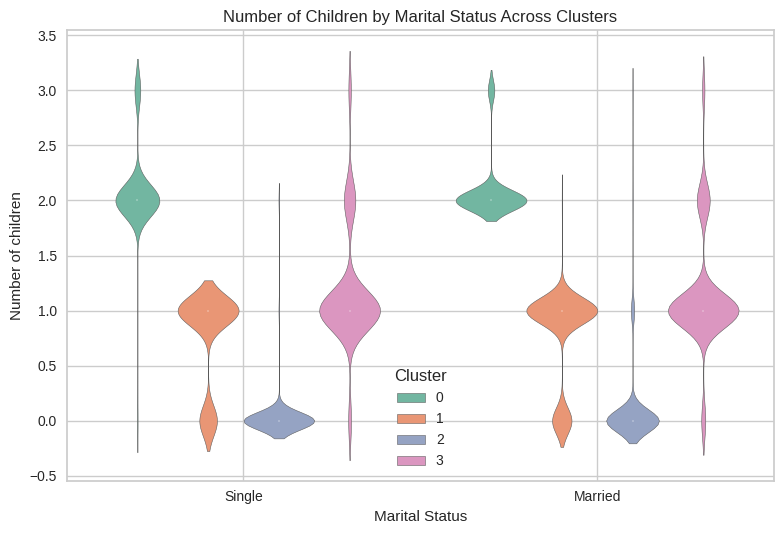

In [ ]:
sns.violinplot( data=data, x='Marital_Status', y='children', hue='Clusters', palette='Set2')
plt.title("Number of Children by Marital Status Across Clusters")
plt.xlabel("Marital Status")
plt.ylabel("Number of children")
plt.legend(title="Cluster")
plt.xticks()
plt.grid(True)
plt.tight_layout()
plt.show()

Cluster 0: Mostly has 2 children, regardless of marital status.
Shows no variation — all values tightly concentrated around 2.
Suggests a family-heavy segment with consistent household size.

Cluster 1: Peaks sharply at 1 child, both for single and married.
Very few customers have 0 or more than 1 child.
This cluster likely represents small modern households or young families.

Cluster 2: Primarily customers with no children, especially for both marital statuses. Very tight and flat distribution — almost no customers have children.
Possibly represents younger singles/couples or child-free professionals.

Cluster 3: Distribution centers around 1-2 children, with more spread than Cluster 1. There are a few with up to 3 children, especially among singles.
This cluster shows diversity in household structure, potentially mid-life or varied demographic.

### Profiling

**Cluster 0** Budget-Conscious Traditional Families

Demographics: Older, mostly married, household size of 3–4 with 2 children
; Income & Spending: Mid income, very low total spending
; Shopping Channels: Prefers in-store, low online and catalog usage
; Promotions: Low campaign response, moderate deal sensitivity
; Education: Mostly graduates, some postgraduates
; Digital Engagement: Low and stable
; Overall Insight: Price-sensitive family segment with traditional shopping habits. Best targeted with basic bundles, essential offers, and in-store loyalty incentives.

**Cluster 1** Young Singles & Mixed Demographics

Demographics: Younger, mostly single, household size of 1–2, often with 1 child
; Income & Spending: Low-to-mid income, low spending with few high outliers
; Shopping Channels: Minimal usage across all channels, slightly more in-store
; Promotions: Least responsive to campaigns or deals
; Education: Most diverse (School to PhD), highest representation of School-level
; Digital Engagement: Moderate, digitally inclined
; Overall Insight: Disengaged or early-career individuals. Could respond to digital-first campaigns, budget-friendly digital bundles, or student-focused offers.

**Cluster 2** Premium Power Buyers

Demographics: Mixed marital status, small households (1–2), mostly child-free
; Income & Spending: Highest income and spending across all clusters
; Shopping Channels: Strong in catalog and store purchases
; Promotions: Highly responsive — many accepted 2–5 campaigns
; Education: Highly educated – Graduates, Masters, PhDs
; Digital Engagement: Low
; Overall Insight: Top-value segment. Best engaged through personalized premium offers, VIP tiers, and catalog-driven loyalty programs.


**Cluster 3** Digitally Active Mid-Income Families

Demographics: Married, mid-sized households (2–3), with 1–2 children
; Income & Spending: Mid-to-high income, moderate to high spending with wider variation
; Shopping Channels: Active on web and store, moderate catalog use
; Promotions: Most deal-sensitive, moderate campaign acceptance
; Education: Mostly graduates, some higher education
; Digital Engagement: Highest among all clusters
; Overall Insight: Balanced, family-focused, and digitally savvy. Ideal for cross-channel marketing, flash deals, and personalized online journeys.

## Classification

### Multivariate Analysis

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix,classification_report, roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [ ]:
df_clean = data_classification.copy()

In [ ]:
df_clean.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'children', 'household_size', 'age', 'total_spent', 'accepted_cmps',
       'promotions', 'total_purchases', 'online_engagement',
       'deal_sensitivity'],
      dtype='object')

In [ ]:
to_drop = ['Dt_Customer', 'Z_CostContact', 'Z_Revenue', 'Year_Birth', 'ID','AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5','promotions']
df_clean = df_clean.drop(to_drop, axis=1)

In [ ]:
df_clean.corr(numeric_only=True)["total_spent"].sort_values(ascending=False)[1:11]

,total_spent
Wines,0.891800
Meat,0.842934
total_purchases,0.820634
Income,0.789296
NumCatalogPurchases,0.778546
NumStorePurchases,0.674556
Fish,0.642759
Fruits,0.614229
Sweets,0.602925
Gold,0.524154


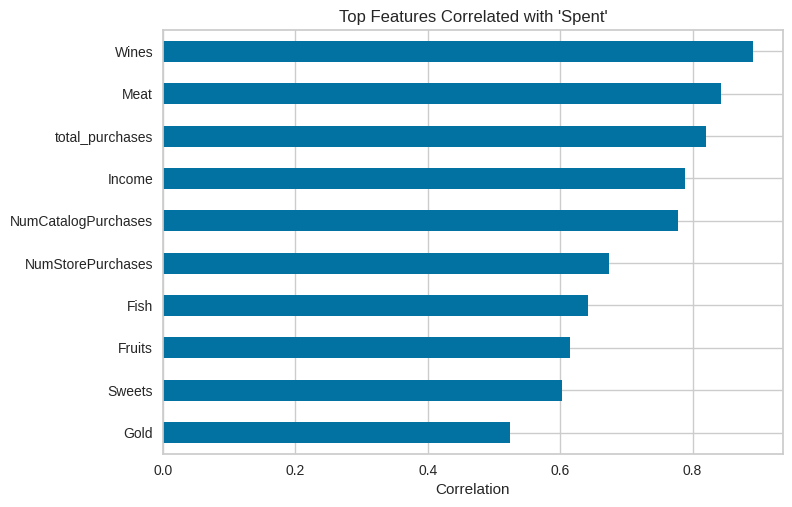

In [ ]:
df_clean.corr(numeric_only=True)["total_spent"].sort_values(ascending=False)[1:11].plot(kind="barh")
plt.title("Top Features Correlated with 'Spent'")
plt.xlabel("Correlation")
plt.gca().invert_yaxis()
plt.show()

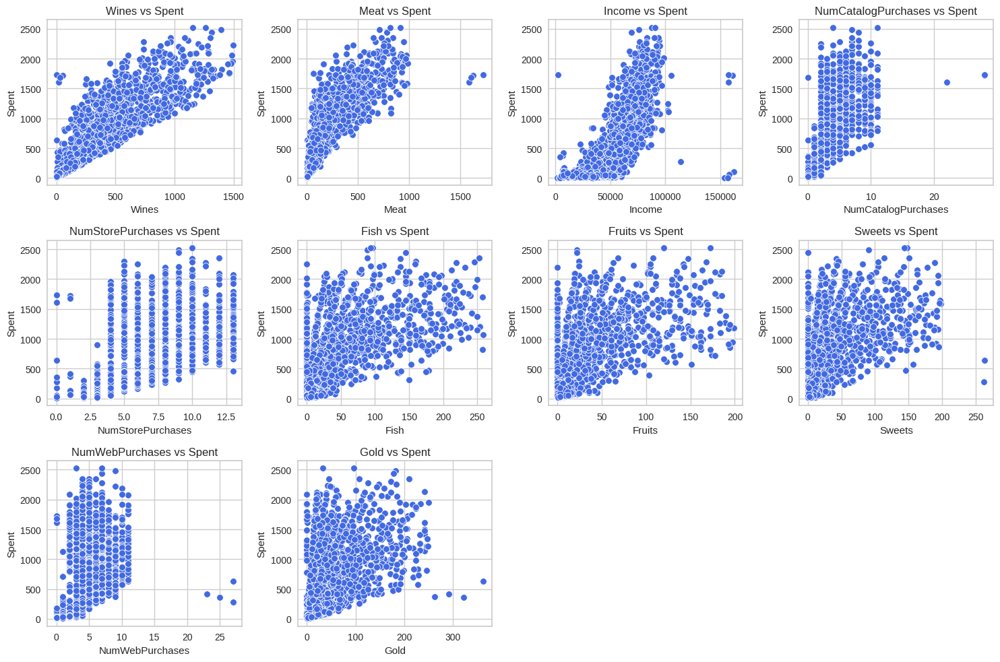

In [ ]:
# Define the columns to plot
features = ['Wines', 'Meat', 'Income', 'NumCatalogPurchases', 'NumStorePurchases',
            'Fish', 'Fruits', 'Sweets', 'NumWebPurchases', 'Gold']

# Set up the figure and axis
plt.figure(figsize=(15, 10))

# Loop over each feature and plot the scatter plot
for i, feature in enumerate(features):
    plt.subplot(3, 4, i+1)  # Create a 3x4 grid of subplots
    sns.scatterplot(data=df_clean, x=feature, y='total_spent', color='royalblue')
    plt.title(f'{feature} vs Spent')
    plt.xlabel(feature)
    plt.ylabel('Spent')
    plt.grid(True)

plt.tight_layout()  # Adjust spacing between subplots
plt.show()


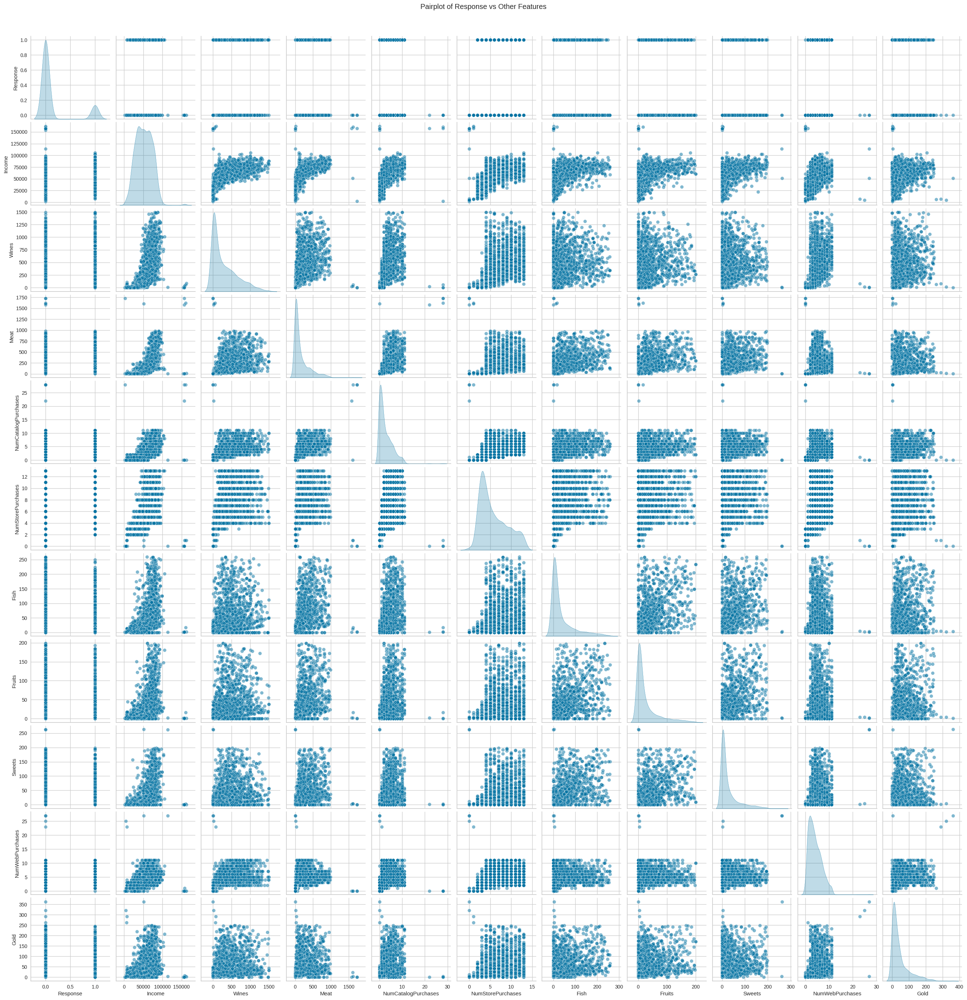

In [ ]:
# Subset the features we're interested in
cols_to_plot = ['Response', 'Income', 'Wines', 'Meat', 'NumCatalogPurchases',
                'NumStorePurchases', 'Fish', 'Fruits', 'Sweets', 'NumWebPurchases', 'Gold']

# Create a pairplot to visualize the relationships
sns.pairplot(df_clean[cols_to_plot], kind='scatter', diag_kind='kde', plot_kws={'alpha': 0.5})
plt.suptitle("Pairplot of Response vs Other Features", y=1.02)
plt.show()


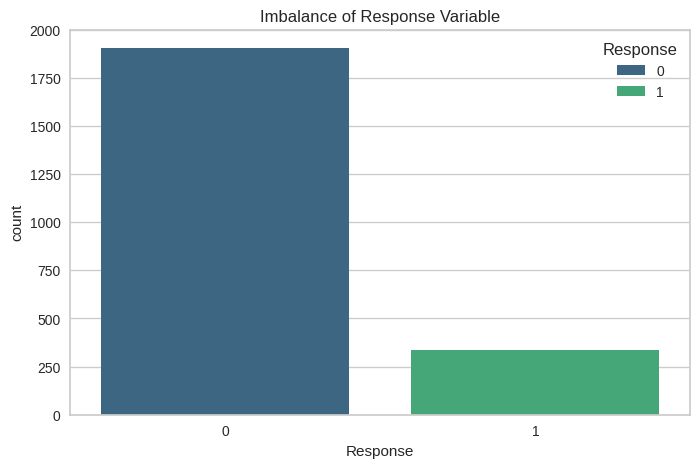

In [ ]:
# Checking imbalance of Response (binary)
plt.figure(figsize=(8, 5))
sns.countplot(x='Response', data=df_clean, hue='Response', palette='viridis')
plt.title('Imbalance of Response Variable')
plt.show()

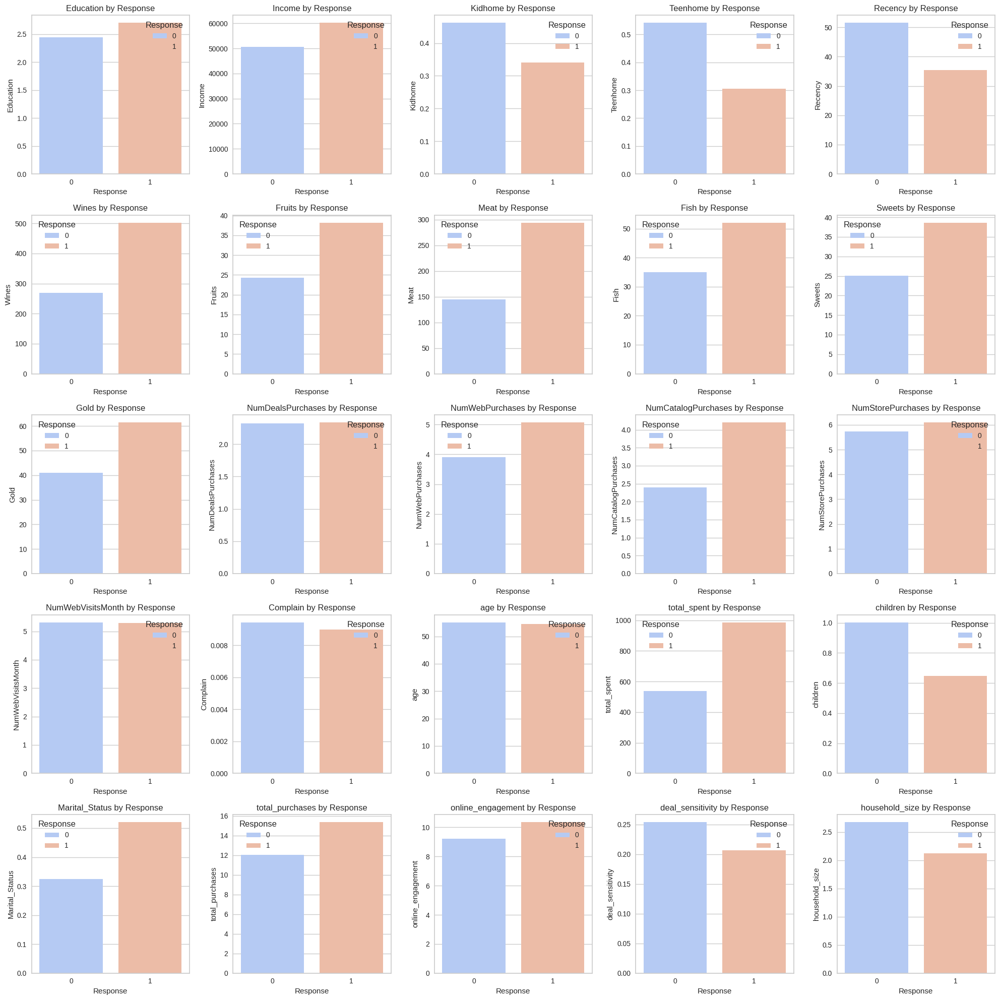

In [ ]:
# List of features to plot with 'Response'
features = [
    'Education','Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines', 'Fruits', 'Meat',
    'Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
    'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
    'Complain', 'age', 'total_spent', 'children', 'Marital_Status',
    'total_purchases', 'online_engagement','deal_sensitivity','household_size'
]

# Number of rows and columns for the subplots
n_rows = 5  # Adjust the number of rows based on your preference
n_cols = 5  # Adjust the number of columns based on your preference

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))
axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easy access

# Loop to plot each feature with 'Response' in the same plot
for i, feature in enumerate(features):
    sns.barplot(x='Response', y=feature, data=df_clean, ax=axes[i], hue='Response', errorbar=None, palette='coolwarm')
    axes[i].set_title(f'{feature} by Response')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

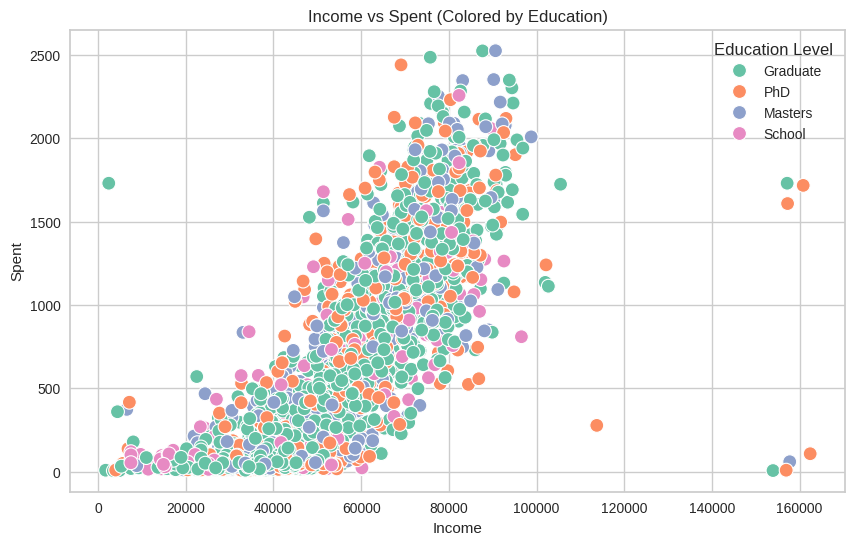

In [ ]:
df_1 = df_clean.copy()

# Create a mapping for the Education column
education_mapping = {1: 'School', 2: 'Graduate', 3: 'Masters', 4: 'PhD'}

# Replace the numeric values with the labels
df_1['Education_Label'] = df_1['Education'].map(education_mapping)

# Use a more vivid color palette
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_1, x='Income', y='total_spent', hue='Education_Label', palette='Set2', s=100)
plt.title('Income vs Spent (Colored by Education)')
plt.xlabel('Income')
plt.ylabel('Spent')
plt.legend(title='Education Level')
plt.grid(True)
plt.show()


### Modelling

In [ ]:
df_clean = df_clean.astype(int)
df = df_clean.copy()

X = df.drop(["Response", "accepted_cmps"], axis=1)
y = df["Response"]

X.shape

(2239, 25)

In [ ]:
# Split data based on stratifying
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [ ]:
# Train Decision Tree and Random Forest models
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Create a dictionary to store the models
models = {
    "Decision Tree": dt_model,
    "Random Forest": rf_model,
}
models_f1_score=[]

# Iterate through the models and display classification reports
for name, model in models.items():
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)  # Get detailed report in dictionary format
    models_f1_score.append(report['weighted avg']['f1-score'])


    print(f"\n===== Baseline {name} =====")
    print(f"Accuracy: {acc:.4f}")

    # Extract and display F1-score, Precision, Recall for each class and averages
    print("\nPrecision, Recall, and F1-scores:")
    for class_label in report:
        if class_label not in ['accuracy', 'macro avg', 'weighted avg']:  # Skip the averages
            print(f"Class {class_label}:")
            print(f"  Precision: {report[class_label]['precision']:.4f}")
            print(f"  Recall: {report[class_label]['recall']:.4f}")
            print(f"  F1-score: {report[class_label]['f1-score']:.4f}")

    print("\nMacro avg:")
    print(f"  Precision: {report['macro avg']['precision']:.4f}")
    print(f"  Recall: {report['macro avg']['recall']:.4f}")
    print(f"  F1-score: {report['macro avg']['f1-score']:.4f}")

    print("\nWeighted avg:")
    print(f"  Precision: {report['weighted avg']['precision']:.4f}")
    print(f"  Recall: {report['weighted avg']['recall']:.4f}")
    print(f"  F1-score: {report['weighted avg']['f1-score']:.4f}")



===== Baseline Decision Tree =====
Accuracy: 0.8229

Precision, Recall, and F1-scores:
Class 0:
  Precision: 0.8967
  Recall: 0.8951
  F1-score: 0.8959
Class 1:
  Precision: 0.4059
  Recall: 0.4100
  F1-score: 0.4080

Macro avg:
  Precision: 0.6513
  Recall: 0.6526
  F1-score: 0.6519

Weighted avg:
  Precision: 0.8236
  Recall: 0.8229
  F1-score: 0.8233

===== Baseline Random Forest =====
Accuracy: 0.8839

Precision, Recall, and F1-scores:
Class 0:
  Precision: 0.8871
  Recall: 0.9895
  F1-score: 0.9355
Class 1:
  Precision: 0.8235
  Recall: 0.2800
  F1-score: 0.4179

Macro avg:
  Precision: 0.8553
  Recall: 0.6348
  F1-score: 0.6767

Weighted avg:
  Precision: 0.8777
  Recall: 0.8839
  F1-score: 0.8585


### Model Tuning

In [ ]:
print("Tuning Random Forest\n")
# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100],  # Number of trees
    'max_depth': [10, 20, 30],  # Maximum depth of trees
    'min_samples_split': [ 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [5, 7, 10],  # Minimum number of samples required at a leaf node
    'max_features': ['sqrt', 'log2'],  # Number of features to consider for a split
    'class_weight': ['balanced'],  # Adjust class weights to handle class imbalance
}

# Initialize Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='f1')

# Fit the model to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Use the best model from GridSearchCV to evaluate on the test set
best_rf_model = grid_search.best_estimator_
y_pred = best_rf_model.predict(X_test)
y_train_pred = best_rf_model.predict(X_train)

acc = accuracy_score(y_test, y_pred)

# Compute F1 scores
train_f1 = f1_score(y_train, y_train_pred)
test_f1 = f1_score(y_test, y_pred)

# Print final evaluation metrics
print(f"Best Hyperparameters: {best_params}")
print(f"Best Cross-Validation F1 Score: {best_score:.4f}")

# Print train classification report
print("\nTrain Classification Report:\n", classification_report(y_train, y_train_pred, digits=4))

# Print test classification report
print("\nTest Classification Report:\n", classification_report(y_test, y_pred, digits=4))


Tuning Random Forest

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Hyperparameters: {'class_weight': 'balanced', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 50}
Best Cross-Validation F1 Score: 0.5243

Train Classification Report:
               precision    recall  f1-score   support

           0     0.9823    0.9182    0.9492      1333
           1     0.6604    0.9060    0.7640       234

    accuracy                         0.9164      1567
   macro avg     0.8214    0.9121    0.8566      1567
weighted avg     0.9343    0.9164    0.9215      1567


Test Classification Report:
               precision    recall  f1-score   support

           0     0.9300    0.9056    0.9176       572
           1     0.5304    0.6100    0.5674       100

    accuracy                         0.8616       672
   macro avg     0.7302    0.7578    0.7425       672
weighted avg     0.8705    0.8616    0.8655       672



In [ ]:
report_tuned = classification_report(y_test, y_pred, output_dict=True, digits=4)
tuned_f1_weighted = report_tuned['weighted avg']['f1-score']

### Compare Tuned RF with default RF

In [ ]:
# ---- Model 1: Default Random Forest ----
rf_model.fit(X_train, y_train)
y_pred_default = rf_model.predict(X_test)
f1_default = f1_score(y_test, y_pred_default, average='weighted')
acc_default = accuracy_score(y_test, y_pred_default)

print("Default RandomForestClassifier")
print(f"Accuracy: {acc_default:.4f}")
print(f"Weighted F1 Score: {f1_default:.4f}")
print(classification_report(y_test, y_pred_default, zero_division=0, digits=4))


# ---- Model 2: Tuned Random Forest (GridSearchCV) ----
best_rf_model = grid_search.best_estimator_
best_rf_model.fit(X_train, y_train)
y_pred_tuned = best_rf_model.predict(X_test)
f1_tuned = f1_score(y_test, y_pred_tuned, average='weighted')
acc_tuned = accuracy_score(y_test, y_pred_tuned)

print("\nTuned RandomForestClassifier (via GridSearchCV)")
print(f"Accuracy: {acc_tuned:.4f}")
print(f"Weighted F1 Score: {f1_tuned:.4f}")
print(classification_report(y_test, y_pred_tuned, zero_division=0, digits=4))


# ---- Comparison Summary ----
print("\nComparison Summary:")
print(f"Default  - Accuracy: {acc_default:.4f}, F1 Score: {f1_default:.4f}")
print(f"Tuned    - Accuracy: {acc_tuned:.4f}, F1 Score: {f1_tuned:.4f}")

if f1_tuned > f1_default:
    print("Model performance improved after tuning.")
elif f1_tuned < f1_default:
    print("F1 score decreased after tuning. Consider adjusting the parameter grid or class imbalance handling.")
else:
    print("F1 score remained the same after tuning.")

Default RandomForestClassifier
Accuracy: 0.8839
Weighted F1 Score: 0.8585
              precision    recall  f1-score   support

           0     0.8871    0.9895    0.9355       572
           1     0.8235    0.2800    0.4179       100

    accuracy                         0.8839       672
   macro avg     0.8553    0.6348    0.6767       672
weighted avg     0.8777    0.8839    0.8585       672


Tuned RandomForestClassifier (via GridSearchCV)
Accuracy: 0.8616
Weighted F1 Score: 0.8655
              precision    recall  f1-score   support

           0     0.9300    0.9056    0.9176       572
           1     0.5304    0.6100    0.5674       100

    accuracy                         0.8616       672
   macro avg     0.7302    0.7578    0.7425       672
weighted avg     0.8705    0.8616    0.8655       672


Comparison Summary:
Default  - Accuracy: 0.8839, F1 Score: 0.8585
Tuned    - Accuracy: 0.8616, F1 Score: 0.8655
Model performance improved after tuning.


In [ ]:
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"y_pred shape: {y_pred.shape}")
print(f"y_pred_tuned shape: {y_pred_tuned.shape}")

X_test shape: (672, 25)
y_test shape: (672,)
y_pred shape: (672,)
y_pred_tuned shape: (672,)


### Confusion Matrix

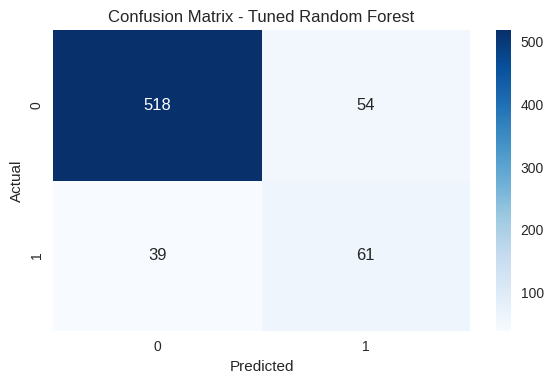

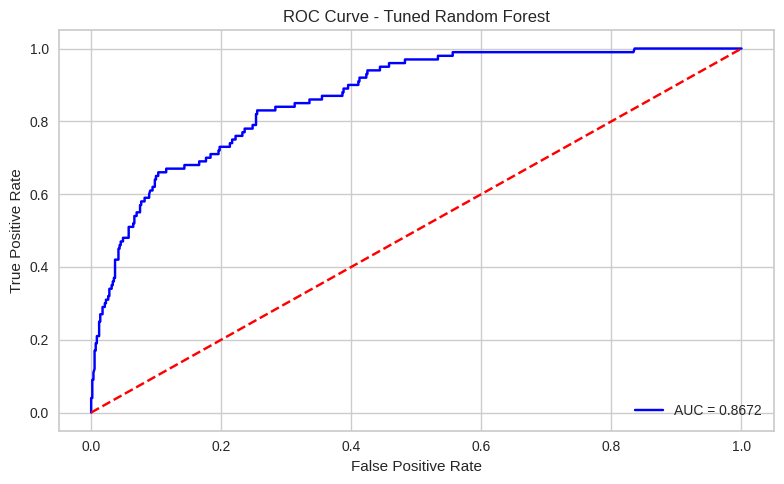

AUC Score: 0.8672


In [ ]:
# --- Confusion Matrix for Tuned Model ---
cm = confusion_matrix(y_test, y_pred_tuned)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=best_rf_model.classes_,
            yticklabels=best_rf_model.classes_)
plt.title('Confusion Matrix - Tuned Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

from sklearn.metrics import roc_curve, roc_auc_score

# Ensure you're using the tuned model
y_pred_proba = best_rf_model.predict_proba(X_test)[:, 1]  # Only for binary classification

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(8, 5))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_score:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='red')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Tuned Random Forest')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"AUC Score: {auc_score:.4f}")


### Plotting Learning Curves

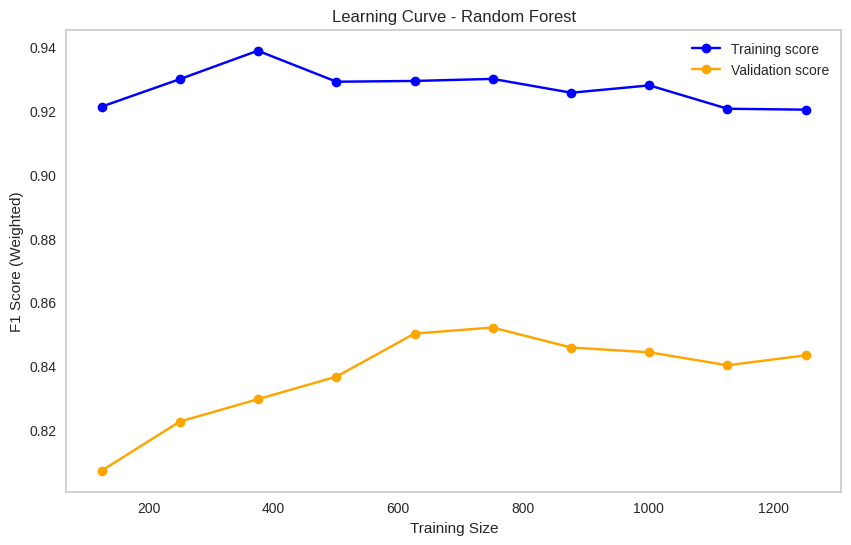

In [ ]:
from sklearn.model_selection import learning_curve


# Define your model (e.g., the best model from GridSearchCV)
model = best_rf_model

# Generate learning curve
train_sizes, train_scores, val_scores = learning_curve(
    model, X_train, y_train, cv=5, scoring='f1_weighted',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

# Mean and std
train_mean = np.mean(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', label="Training score", color="blue")
plt.plot(train_sizes, val_mean, 'o-', label="Validation score", color="orange")
plt.title("Learning Curve - Random Forest")
plt.xlabel("Training Size")
plt.ylabel("F1 Score (Weighted)")
plt.legend(loc="best")
plt.grid()
plt.show()

The learning curve shows that the model achieves a high training score, indicating that it fits the training data very well. The validation score starts lower but gradually increases to approximately 0.86 as more training data is used.


The model is not underfitting, as it performs well on training data.

There's a slight overfitting, indicated by the gap between training and validation scores.

However, the increasing validation score implies the model benefits from more data and generalizes reasonably well.



### Validation Curve

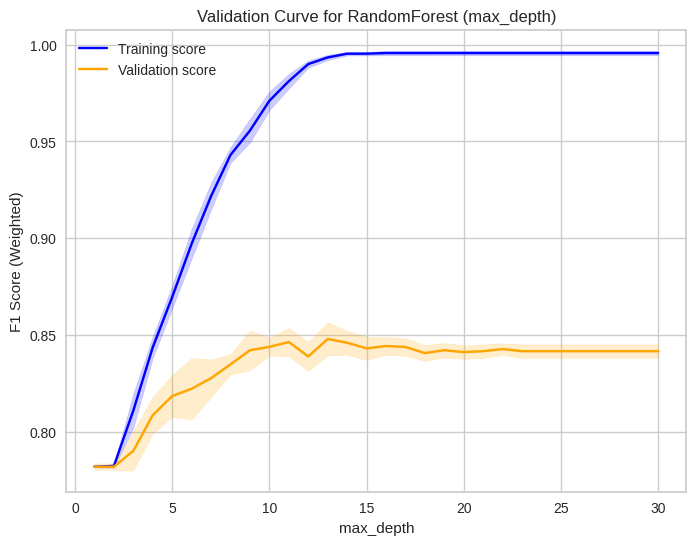

Best max_depth: 13
Best Validation F1 Score: 0.8480

Underfitting (Left region of plot):
Parameter range for underfitting: [ 1  2  3  4  5  6  7  8  9 10 11 12]

Optimal Fitting (Middle region):
Optimal parameter (best max_depth): 13

Overfitting (Right region of plot):
Parameter range for overfitting: [13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30]


In [ ]:
from sklearn.model_selection import validation_curve

# hyperparameter `max_depth`
param_range = np.arange(1, 31)  # Range of max_depth values from 1 to 30

# Compute the training and validation scores
train_scores, valid_scores = validation_curve(
    RandomForestClassifier(random_state=42),
    X_train, y_train,
    param_name="max_depth",
    param_range=param_range,
    cv=5,
    scoring="f1_weighted",  # Use weighted F1 score
    n_jobs=-1
)

# Calculate the mean and std deviation for each curve
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
valid_mean = np.mean(valid_scores, axis=1)
valid_std = np.std(valid_scores, axis=1)

# Plotting the validation curve
plt.figure(figsize=(8, 6))
plt.plot(param_range, train_mean, label="Training score", color='blue')
plt.plot(param_range, valid_mean, label="Validation score", color='orange')
plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, alpha=0.2, color='blue')
plt.fill_between(param_range, valid_mean - valid_std, valid_mean + valid_std, alpha=0.2, color='orange')

plt.title("Validation Curve for RandomForest (max_depth)")
plt.xlabel("max_depth")
plt.ylabel("F1 Score (Weighted)")
plt.legend(loc="best")
plt.grid(True)
plt.show()

# Now extract insights from the plot:
# Finding the "underfitting", "optimal", and "overfitting" regions
best_index = np.argmax(valid_mean)  # Index where validation score is highest
best_max_depth = param_range[best_index]
best_validation_score = valid_mean[best_index]

print(f"Best max_depth: {best_max_depth}")
print(f"Best Validation F1 Score: {best_validation_score:.4f}")

# Underfitting check: if validation score is low and training score is also low (on left of plot)
underfitting_range = param_range[:best_index]  # Check the range before the peak

# Overfitting check: if training score is high but validation score starts dropping (on right of plot)
overfitting_range = param_range[best_index:]  # Check the range after the peak

# Report the regions of underfitting, good fit, and overfitting
print("\nUnderfitting (Left region of plot):")
print(f"Parameter range for underfitting: {underfitting_range}")

print("\nOptimal Fitting (Middle region):")
print(f"Optimal parameter (best max_depth): {best_max_depth}")

print("\nOverfitting (Right region of plot):")
print(f"Parameter range for overfitting: {overfitting_range}")


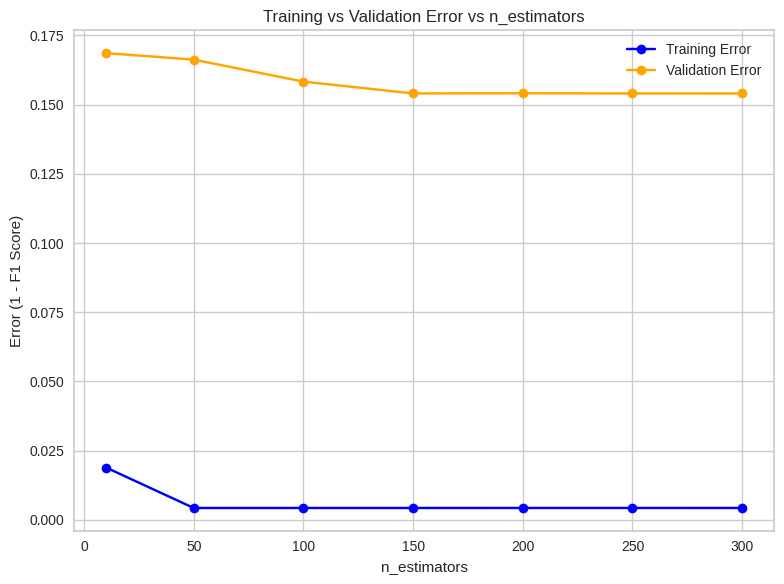

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import validation_curve
from sklearn.ensemble import RandomForestClassifier

# Define the range of n_estimators to test
param_range = [10, 50, 100, 150, 200, 250, 300]

# Compute training and validation scores
train_scores, valid_scores = validation_curve(
    RandomForestClassifier(random_state=42),
    X_train, y_train,
    param_name="n_estimators",
    param_range=param_range,
    cv=5,
    scoring="f1_weighted",
    n_jobs=-1
)

# Calculate mean F1 scores
train_mean = np.mean(train_scores, axis=1)
valid_mean = np.mean(valid_scores, axis=1)

# Calculate error as 1 - F1 score
train_error = 1 - train_mean
valid_error = 1 - valid_mean

# Plot the error curves
plt.figure(figsize=(8, 6))
plt.plot(param_range, train_error, marker='o', label='Training Error', color='blue')
plt.plot(param_range, valid_error, marker='o', label='Validation Error', color='orange')

plt.title("Training vs Validation Error vs n_estimators")
plt.xlabel("n_estimators")
plt.ylabel("Error (1 - F1 Score)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### F1 Score Comparison Across Different Random Forest Models and Decision Tree

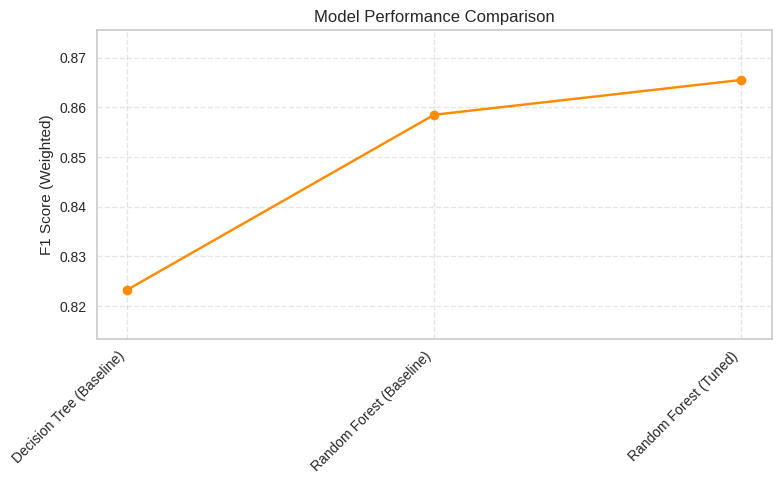

In [ ]:
# Names of models
model_names = [
    'Decision Tree (Baseline)',
    'Random Forest (Baseline)',
    'Random Forest (Tuned)'
]

# Corresponding F1 scores
f1_scores = [
    models_f1_score[0],       # Decision Tree
    models_f1_score[1],       # RF baseline
    tuned_f1_weighted       # RF tuned
]

plt.figure(figsize=(8, 5))
plt.plot(model_names, f1_scores, marker='o', linestyle='-', color='darkorange')
plt.ylabel("F1 Score (Weighted)")
plt.title("Model Performance Comparison")
plt.ylim(min(f1_scores) - 0.01, max(f1_scores) + 0.01)
plt.grid(True, linestyle='--', alpha=0.5)

# Rotate x-axis labels to prevent overlap
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


### Feature Importance Analysis

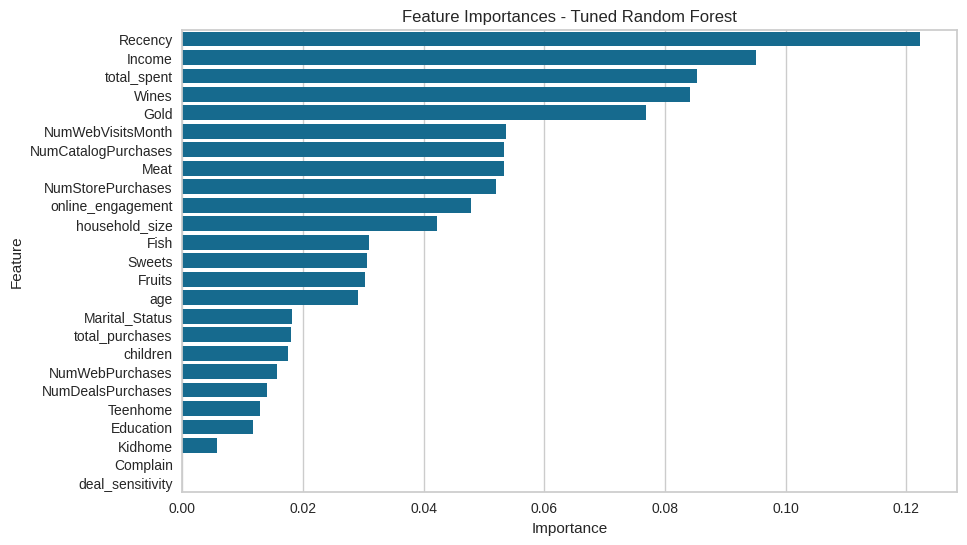

In [ ]:
importances = best_rf_model.feature_importances_
feature_names = X_train.columns
feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feat_df = feat_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_df, x='Importance', y='Feature')
plt.title('Feature Importances - Tuned Random Forest')
plt.show()

## Regression

### Feature exploration

In [ ]:
data_regression.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,Wines,...,Response,children,household_size,age,total_spent,accepted_cmps,promotions,total_purchases,online_engagement,deal_sensitivity
0,5524,1957,2,1,58138.0,0,0,04-09-2012,58,635,...,1,0,1,67,1617,1,0.166667,22,15,0.136364
1,2174,1954,2,1,46344.0,1,1,08-03-2014,38,11,...,0,2,3,70,27,0,0.000000,4,6,0.500000
2,4141,1965,2,0,71613.0,0,0,21-08-2013,26,426,...,0,0,2,59,776,0,0.000000,20,12,0.050000
3,6182,1984,2,0,26646.0,1,0,10-02-2014,26,11,...,0,1,3,40,53,0,0.000000,6,8,0.333333
4,5324,1981,4,0,58293.0,1,0,19-01-2014,94,173,...,0,1,3,43,422,0,0.000000,14,10,0.357143


In [ ]:
dfr = data_regression.copy()

In [ ]:
to_drop = ['ID', 'Year_Birth', 'Wines', 'Fruits', 'Meat', 'Fish','Sweets', 'Gold','Dt_Customer']
dfr = dfr.drop(to_drop, axis=1)

In [ ]:
dfr.describe().T

,count,mean,std,min,25%,50%,75%,max
Education,2239.0,2.484591,0.955960,1.0,2.000000,2.0,3.000000,4.000000
Marital_Status,2239.0,0.353729,0.478233,0.0,0.000000,0.0,1.000000,1.000000
Income,2239.0,51963.554712,21410.672116,1730.0,35533.500000,51381.5,68277.500000,162397.000000
Kidhome,2239.0,0.443948,0.538390,0.0,0.000000,0.0,1.000000,2.000000
Teenhome,2239.0,0.506476,0.544555,0.0,0.000000,0.0,1.000000,2.000000
Recency,2239.0,49.121036,28.963662,0.0,24.000000,49.0,74.000000,99.000000
NumDealsPurchases,2239.0,2.324252,1.932345,0.0,1.000000,2.0,3.000000,15.000000
NumWebPurchases,2239.0,4.085306,2.779240,0.0,2.000000,4.0,6.000000,27.000000
NumCatalogPurchases,2239.0,2.662796,2.923542,0.0,0.000000,2.0,4.000000,28.000000
NumStorePurchases,2239.0,5.791425,3.251149,0.0,3.000000,5.0,8.000000,13.000000


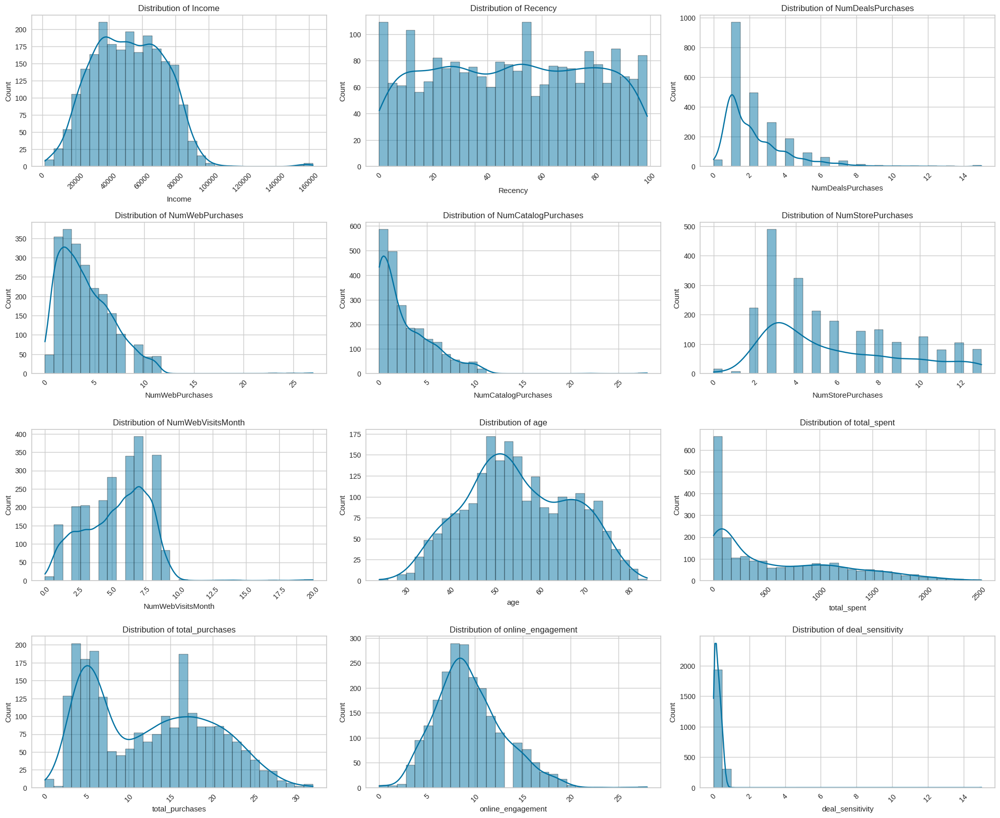

In [ ]:
# Set up the grid
fig, axes = plt.subplots(5, 3, figsize=(20, 20))  # 5 rows x 3 columns
axes = axes.flatten()

# Plot each numerical column
numerical_columns = ['Income', 'Recency', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'age', 'total_spent',
       'total_purchases', 'online_engagement',
       'deal_sensitivity']

for i, col in enumerate(numerical_columns):
    sns.histplot(data[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].tick_params(axis='x', rotation=45)  # Optional: tilt x labels if needed

# Hide any unused axes if the number of plots < total grid size
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
dfr.columns

Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'children', 'household_size', 'age', 'total_spent', 'accepted_cmps',
       'promotions', 'total_purchases', 'online_engagement',
       'deal_sensitivity'],
      dtype='object')

### Feature Selection

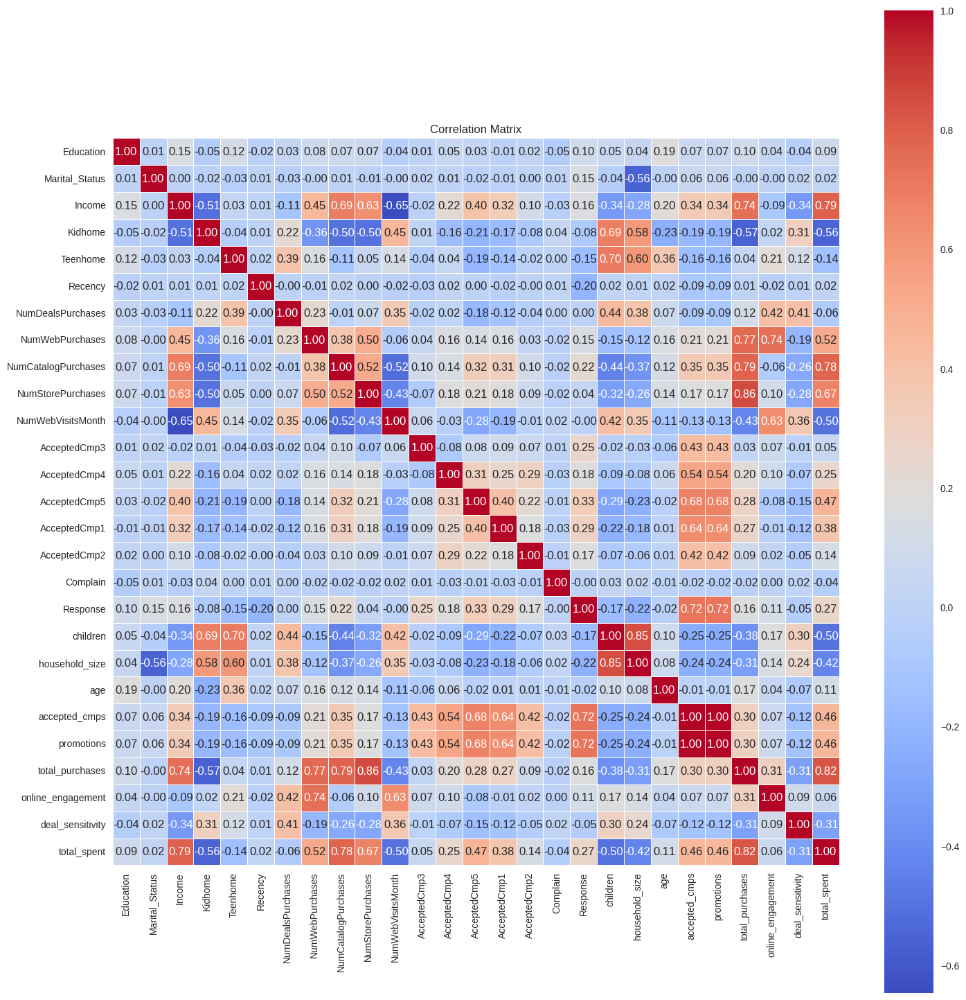

In [ ]:
correlation_features = ['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response',
       'children', 'household_size', 'age', 'accepted_cmps',
       'promotions', 'total_purchases', 'online_engagement',
       'deal_sensitivity','total_spent']
corr_matrix = dfr[correlation_features].corr()

# Plot heatmap
plt.figure(figsize=(15,15))
sns.heatmap(
    corr_matrix,
    annot=True,        # display values in cells
    fmt=".2f",         # 2 decimal places
    cmap='coolwarm',   # red-blue color scale
    square=True,       # square cells
    linewidths=0.5     # border lines
)
plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

In [ ]:
# Pearson's Correlation Score
X = dfr.drop('total_spent', axis=1)
y = dfr['total_spent']

correlations = X.corrwith(y)
correlations = correlations.abs().sort_values(ascending=False)

print(correlations)

total_purchases        0.820634
Income                 0.789296
NumCatalogPurchases    0.778546
NumStorePurchases      0.674556
Kidhome                0.556486
NumWebPurchases        0.519791
NumWebVisitsMonth      0.500204
children               0.498952
AcceptedCmp5           0.470039
accepted_cmps          0.456112
promotions             0.456112
household_size         0.422709
AcceptedCmp1           0.381492
deal_sensitivity       0.310728
Response               0.265188
AcceptedCmp4           0.253226
Teenhome               0.138812
AcceptedCmp2           0.135791
age                    0.112594
Education              0.090937
NumDealsPurchases      0.064785
online_engagement      0.064286
AcceptedCmp3           0.053282
Complain               0.037105
Recency                0.020076
Marital_Status         0.016215
Z_CostContact               NaN
Z_Revenue                   NaN
dtype: float64


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [ ]:
# Mutual Information Score
from sklearn.feature_selection import mutual_info_classif

y = dfr['total_spent']
X = dfr.drop('total_spent', axis=1)

discrete_cols = ['Education', 'Marital_Status', 'Kidhome', 'Teenhome',
        'NumDealsPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'children', 'household_size',
       'accepted_cmps','Z_CostContact','Z_Revenue']

continuous_cols = [col for col in X.columns if col not in discrete_cols]

# Discrete features
mi_discrete = mutual_info_classif(X[discrete_cols], y, discrete_features=True, random_state=42)
data_discrete = pd.DataFrame({'Feature': discrete_cols, 'MI_Score': mi_discrete})

# Continuous features
mi_continuous = mutual_info_classif(X[continuous_cols], y, discrete_features=False, random_state=42)
data_continuous = pd.DataFrame({'Feature': continuous_cols, 'MI_Score': mi_continuous})

# Combine and sort
mi_data = pd.concat([data_discrete, data_continuous]).sort_values(by='MI_Score', ascending=False)

# Display results
print(mi_data)

                Feature  MI_Score
6       total_purchases  2.478783
5     NumStorePurchases  1.908325
6     NumWebVisitsMonth  1.472233
2       NumWebPurchases  1.465917
3   NumCatalogPurchases  1.429759
4     NumDealsPurchases  1.188200
0                Income  1.135991
8      deal_sensitivity  1.095877
7     online_engagement  0.853621
15       household_size  0.813379
0             Education  0.715129
14             children  0.692336
16        accepted_cmps  0.657272
4                   age  0.566191
2               Kidhome  0.505119
1               Recency  0.473102
3              Teenhome  0.455849
1        Marital_Status  0.334528
5            promotions  0.288399
13             Response  0.286542
9          AcceptedCmp5  0.239148
8          AcceptedCmp4  0.221240
10         AcceptedCmp1  0.212326
7          AcceptedCmp3  0.169771
11         AcceptedCmp2  0.061963
12             Complain  0.033195
18            Z_Revenue  0.000000
17        Z_CostContact  0.000000


In [ ]:
to_drop = ['Kidhome', 'Teenhome', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases',
           'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'promotions','Z_CostContact','Z_Revenue']
dfr = dfr.drop(to_drop, axis=1)

In [ ]:
dfr.columns

Index(['Education', 'Marital_Status', 'Income', 'Recency', 'NumDealsPurchases',
       'NumWebVisitsMonth', 'Complain', 'Response', 'children',
       'household_size', 'age', 'total_spent', 'accepted_cmps',
       'total_purchases', 'online_engagement', 'deal_sensitivity'],
      dtype='object')

### Splitting dataset

In [ ]:
from sklearn.model_selection import train_test_split
# Define X and y properly
feature_columns = ['Education', 'Marital_Status', 'Income', 'Recency', 'NumDealsPurchases',
       'NumWebVisitsMonth', 'Complain', 'Response', 'children',
       'household_size', 'age','accepted_cmps',
       'total_purchases', 'online_engagement', 'deal_sensitivity']

X = dfr[feature_columns]
y = dfr['total_spent']

# Split the data
X_train, X_data, y_train, y_data = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_data, y_data, test_size=0.5, random_state=42)

### Data Transformation

In [ ]:
# Apply log transform to reduce skew
y_train = np.log1p(y_train)
y_val = np.log1p(y_val)
y_test = np.log1p(y_test)

In [ ]:
for feature in feature_columns:
    X_train[feature] = np.log1p(X_train[feature])
    X_val[feature] = np.log1p(X_val[feature])
    X_test[feature] = np.log1p(X_test[feature])

In [ ]:
# Scaling features so that they are in similar range
from sklearn.preprocessing import RobustScaler

# Select features to scale
features_to_scale = ['Education', 'Marital_Status', 'Income', 'Recency', 'NumDealsPurchases',
       'NumWebVisitsMonth', 'Complain', 'Response', 'children',
       'household_size', 'age','accepted_cmps', 'total_purchases', 'online_engagement', 'deal_sensitivity']

# Fit only on training set
scaler = RobustScaler()
scaler.fit(X_train[features_to_scale])

# Apply to all sets
for df in [X_train, X_val, X_test]:
    scaled_features = scaler.transform(df[features_to_scale])
    df[['Education', 'Marital_Status', 'Income', 'Recency', 'NumDealsPurchases',
       'NumWebVisitsMonth', 'Complain', 'Response', 'children', 'household_size', 'age','accepted_cmps',
       'total_purchases', 'online_engagement', 'deal_sensitivity']] = scaled_features


### Modelling

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.dummy import DummyRegressor


In [ ]:

# Train baseline model
X = X_train
y = y_train # log-transformed rent
base_reg = DummyRegressor(strategy="mean")
base_reg.fit(X, y)

# Predict on training data
y_pred = base_reg.predict(X)

# Calculate performance metrics
rmse = root_mean_squared_error(y, y_pred)
mae = mean_absolute_error(y, y_pred)
r2 = r2_score(y, y_pred)

# Display results
print(f"Dummy Regressor Performance:")
print(f"RMSE: {rmse:.6f}")
print(f"MAE:  {mae:.6f}")
print(f"R²:   {r2:.6f}")

Dummy Regressor Performance:
RMSE: 1.484280
MAE:  1.319418
R²:   0.000000


In [ ]:
model1 = LinearRegression(fit_intercept=True)

model1.fit(X_train, y_train)

# Predict
y_pred_train = model1.predict(X_train)
y_pred_val = model1.predict(X_val)

print("\n Training set:")
# Regression evaluation
print("R² Score:", r2_score(y_train, y_pred_train))
print("MAE:", mean_absolute_error(y_train, y_pred_train))
print("RMSE:", root_mean_squared_error(y_train, y_pred_train))

print("\n Validation set:")
# Regression evaluation
print("R² Score:", r2_score(y_val, y_pred_val))
print("MAE:", mean_absolute_error(y_val, y_pred_val))
print("RMSE:", root_mean_squared_error(y_val, y_pred_val))

# Predict
y_pred_test = model1.predict(X_test)

print("\n Test set:")
# Regression evaluation
print("R² Score:", r2_score(y_test, y_pred_test))
print("MAE:", mean_absolute_error(y_test, y_pred_test))
print("RMSE:", root_mean_squared_error(y_test, y_pred_test))

# Convert back to actual value
y_actual_spent = np.exp(y_test)
y_pred_spent = np.exp(y_pred_test)

# Use metric functions (not the previous float variables)
rmse = root_mean_squared_error(y_actual_spent, y_pred_spent)
mae = mean_absolute_error(y_actual_spent, y_pred_spent)
r2 = r2_score(y_actual_spent, y_pred_spent)

# Print results
print("\nRegressor Performance (in $):")
print(f"RMSE: ${rmse:.4f}")
print(f"MAE:  ${mae:.4f}")
print(f"R²:   {r2:.4f}")


 Training set:
R² Score: 0.917277011725359
MAE: 0.28262745606286516
RMSE: 0.4269028597846364

 Validation set:
R² Score: 0.9311150427916358
MAE: 0.2713038672286173
RMSE: 0.3799127839200651

 Test set:
R² Score: 0.9411861114297956
MAE: 0.2609277074142912
RMSE: 0.35103868966910257

Regressor Performance (in $):
RMSE: $312.6547
MAE:  $166.1699
R²:   0.6902


In [ ]:
# ElasticNet
from scipy.stats import uniform
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'alpha': uniform(loc=0.01, scale=10.0),
    'l1_ratio': uniform(loc=0.0, scale=1.0)  # 0 = Ridge, 1 = Lasso
}

elastic_net = ElasticNet(max_iter=10000)
grid = RandomizedSearchCV(estimator=elastic_net, param_distributions=param_grid, cv=5, scoring='r2', n_iter=50, random_state= 42)
grid.fit(X_train, y_train)

# Best model
best_model = grid.best_estimator_
print("Best Parameters:", grid.best_params_)

# Predict
y_pred_train = best_model.predict(X_train)
y_pred_val = best_model.predict(X_val)
y_pred_test = best_model.predict(X_test)

print("\n Training set:")
# Regression evaluation
print("R² Score:", r2_score(y_train, y_pred_train))
print("MAE:", mean_absolute_error(y_train, y_pred_train))
print("RMSE:", root_mean_squared_error(y_train, y_pred_train))

print("\n Validation set:")
# Regression evaluation
print("R² Score:", r2_score(y_val, y_pred_val))
print("MAE:", mean_absolute_error(y_val, y_pred_val))
print("RMSE:", root_mean_squared_error(y_val, y_pred_val))

print("\n Test set:")
# Regression evaluation
print("R² Score:", r2_score(y_test, y_pred_test))
print("MAE:", mean_absolute_error(y_test, y_pred_test))
print("RMSE:", root_mean_squared_error(y_test, y_pred_test))

Best Parameters: {'alpha': np.float64(0.06522117123602399), 'l1_ratio': np.float64(0.8154614284548342)}

 Training set:
R² Score: 0.9038739430984561
MAE: 0.3129238376432586
RMSE: 0.4601893045583904

 Validation set:
R² Score: 0.9182384839107962
MAE: 0.30086412988680905
RMSE: 0.41390071737265255

 Test set:
R² Score: 0.9278674467236308
MAE: 0.2935175677598013
RMSE: 0.3887592093460018
